In [1]:
!pip install git+https://github.com/AnDiChallenge/andi_datasets.git -q


In [2]:
public_data_path = '/kaggle/input/andi2-benchmark-dataset' # make sure the folder has this name or change it
# Define the number of experiments, number of FOVs (Field of Views), and number of frames
N_EXP = 9 
N_FOVS = 30
N_FRAMES = 200
EXP1 = 1 # numper of the first experiment (0 for starting_kit; 1 for benchmark)

In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.stats import norm
from scipy.stats import anderson
from scipy.signal import find_peaks, argrelextrema

np.random.seed(0)

In [4]:
import numpy as np
import tensorflow as tf

class TAMSDalpha(tf.keras.layers.Layer):
    def __init__(self, use_correction=True, trim_percent=5, **kwargs):
        """
        Initialize a TAMSDalpha layer.

        Args:
            use_correction (bool): Whether to apply the normalisation correction term. Defaults to True.
            trim_percent (float): Percentage of largest values to trim in MSD calculation.
        """
        super(TAMSDalpha, self).__init__(**kwargs)
        self.use_correction = use_correction
        self.trim_percent = trim_percent

    # ---------- helpers: nan-aware mean / std ----------
    @staticmethod
    def nanmean(tensor, axis=None, keepdims=False):
        """
        tf analogue of np.nanmean that ignores NaNs.
        """
        mask = ~tf.math.is_nan(tensor)
        masked_tensor = tf.where(mask, tensor, tf.zeros_like(tensor))
        count = tf.reduce_sum(tf.cast(mask, tf.float32), axis=axis, keepdims=keepdims)
        sum_ = tf.reduce_sum(masked_tensor, axis=axis, keepdims=keepdims)
        return sum_ / (count + 1e-8)

    @staticmethod
    def nanstd(tensor, axis=None, keepdims=False):
        """
        tf analogue of np.nanstd that ignores NaNs.
        """
        mean_ = TAMSDalpha.nanmean(tensor, axis=axis, keepdims=True)
        sq_diff = tf.square(tensor - mean_)
        var_ = TAMSDalpha.nanmean(sq_diff, axis=axis, keepdims=keepdims)
        return tf.sqrt(var_ + 1e-8)

    # ---------- helpers: trimming ----------
    @staticmethod
    def trim_array1s(arr, percent):
        """
        Remove the specified percentage of the largest values from each row, ignoring NaNs.
        """
        def trim_row(row):
            valid = ~tf.math.is_nan(row)
            valid_values = tf.boolean_mask(row, valid)
            n_valid = tf.shape(valid_values)[0]

            def no_valid():
                return row

            def do_trim():
                k_float = tf.cast(n_valid, tf.float32) * (percent / 100.0)
                k = tf.cast(tf.round(k_float), tf.int32)

                def no_trim():
                    return row

                def trim_values():
                    # Sort valid (non-NaN) values ascending
                    sorted_valid = tf.sort(valid_values, direction='ASCENDING')
                    # Threshold is the k-th value from the end
                    threshold = sorted_valid[-k]
                    # Replace values >= threshold with NaN
                    return tf.where(row < threshold, row, tf.constant(np.nan, dtype=row.dtype))

                return tf.cond(tf.equal(k, 0), no_trim, trim_values)

            return tf.cond(tf.equal(n_valid, 0), no_valid, do_trim)

        return tf.map_fn(trim_row, arr)

    @staticmethod
    def trim_array1s_tea(arr, percent):
        """
        Remove the specified percentage of the largest values over the entire tensor, ignoring NaNs.
        """
        valid = ~tf.math.is_nan(arr)
        valid_values = tf.boolean_mask(arr, valid)
        n_valid = tf.shape(valid_values)[0]

        def no_valid():
            return arr

        def do_trim():
            k_float = tf.cast(n_valid, tf.float32) * (percent / 100.0)
            k = tf.cast(tf.round(k_float), tf.int32)

            def no_trim():
                return arr

            def trim_values():
                sorted_valid = tf.sort(valid_values, direction='ASCENDING')
                threshold = sorted_valid[-k]
                return tf.where(arr < threshold, arr, tf.constant(np.nan, dtype=arr.dtype))

            return tf.cond(tf.equal(k, 0), no_trim, trim_values)

        return tf.cond(tf.equal(n_valid, 0), no_valid, do_trim)

    # ---------- TEA-MSD normalisation ----------
    def tf_normalize_distribution(self, arr, target_mean, T):
        """
        Apply the normalisation correction term proposed in TEA-MSD.

        Args:
            arr (tf.Tensor): Array to be normalised (shape: (batch_size,)).
            target_mean (tf.Tensor): Global TEA-MSD estimate.
            T (tf.Tensor): Effective trajectory length per particle (shape: (batch_size,)).

        Returns:
            tf.Tensor: Corrected array.
        """
        current_mean = self.nanmean(arr)
        current_std = self.nanstd(arr)
        adjustment_term = tf.maximum(current_std**2 - 0.92 / T, 0)**0.5
        standardized = (arr - current_mean) / (current_std + 1e-8)
        return standardized * adjustment_term + target_mean

    # ---------- forward pass ----------
    def call(self, inputs):
        """
        Forward pass.

        Args:
            inputs (tf.Tensor): Tensor of shape (batch_size, timesteps, input_channels).

        Returns:
            tf.Tensor: Estimated alpha values per trajectory (shape: (batch_size,)).
        """
        batch_size = tf.shape(inputs)[0]
        timesteps = tf.shape(inputs)[1]
        input_channels = tf.shape(inputs)[2]

        # Count non-NaN elements per trajectory (batch_size,)
        not_nan_mask = ~tf.math.is_nan(inputs)
        not_nan_count = tf.reduce_sum(tf.cast(not_nan_mask, tf.float32), axis=[1, 2])

        epsilon = 1e-14
        x_all = inputs
        max_lag = 4
        msds = []
        teamsd_list = []

        # --- Calculate MSD and TEA-MSD ---
        for lag in range(1, max_lag + 1):
            displacements = x_all[:, lag:, :] - x_all[:, :-lag, :]
            squared_displacements = tf.square(displacements)
            squared_displacements_sum = tf.reduce_sum(squared_displacements, axis=2)

            # Per-trajectory trimming
            msd = self.nanmean(self.trim_array1s(squared_displacements_sum, self.trim_percent), axis=1)
            msds.append(msd)

            # Global trimming (TEA-MSD)
            teamsd_lag = self.nanmean(self.trim_array1s_tea(squared_displacements_sum, self.trim_percent))
            teamsd_list.append(teamsd_lag)

        msds = tf.stack(msds, axis=1)         # shape: (batch_size, max_lag)
        teamsd = tf.stack(teamsd_list, axis=0)  # shape: (max_lag,)

        t_lags = tf.range(1, max_lag + 1, dtype=tf.float32)
        log_t_lags = tf.math.log(t_lags + epsilon)

        # --- TEA-MSD alpha (global) ---
        log_teamsd = tf.math.log(teamsd + epsilon)
        mean_x = self.nanmean(log_t_lags)
        mean_x2 = self.nanmean(tf.square(log_t_lags))
        mean_y_teamsd = self.nanmean(log_teamsd)
        mean_xy_teamsd = self.nanmean(log_t_lags * log_teamsd)

        numerator_teamsd = mean_xy_teamsd - mean_x * mean_y_teamsd
        denominator = mean_x2 - mean_x**2
        alpha_teamsd = numerator_teamsd / denominator  # scalar

        # --- Per-trajectory alpha ---
        log_msds = tf.math.log(msds + epsilon)
        mean_y = self.nanmean(log_msds, axis=1)
        mean_xy = self.nanmean(log_t_lags * log_msds, axis=1)
        numerator = mean_xy - mean_x * mean_y
        alpha = numerator / denominator               # shape: (batch_size,)

        # --- Mask trajectories with vanishing MSD ---
        last_msd = msds[:, -1]
        mask_nan = last_msd < 1e-6
        alpha = tf.where(mask_nan, tf.fill(tf.shape(alpha), np.nan), alpha)

        T = not_nan_count + 1                         # shape: (batch_size,)

        # --- Apply correction term if enabled ---
        if self.use_correction:
            alpha = self.tf_normalize_distribution(alpha, alpha_teamsd, T)

        return alpha



2025-06-08 14:59:57.783498: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-06-08 14:59:57.783639: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-06-08 14:59:57.950273: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [5]:
def np_normalize_distribution(arr, target_mean, target_var):
        """
        Numpy implementation of distribution normalization, ignoring NaN values.

        Args:
            arr : Input array to normalize.
            target_mean : Target mean for normalization.

        Returns:
            Normalized array.
        """
        current_mean = np.nanmean(arr)
        current_std = np.nanstd(arr)

        # Correction term for normalization
        standardized = (arr - current_mean) / (current_std + 1e-12)

        return standardized * target_var**0.5 + target_mean

In [6]:
def fill_short_segments_np(labels, minseq=3):
    """
    Fills short segments in the labels array with neighboring values.
    
    Args:
    labels (numpy.array): Input array of labels
    minseq (int): Minimum sequence length to keep unchanged (default: 3)
    
    Returns:
    numpy.array: Modified array with short segments filled
    """
    
    # Recursive call for larger minseq values
    if minseq > 2:
        labels = fill_short_segments_np(labels, minseq=minseq - 1)
    
    # Create a copy of the input array to avoid modifying the original
    labels = labels.copy()
    n = len(labels)
    
    # Find the change points (boundaries between different labels)
    change_points = np.where(np.diff(labels) != 0)[0] + 1
    
    # Split the array into segments based on change points
    segments = np.split(np.arange(n), change_points)
    
    for segment in segments:
        # If segment length is less than minseq, fill it with neighboring values
        if len(segment) < minseq:
            # Determine left and right neighbor indices
            left_neighbor_idx = segment[0] - 1 if segment[0] > 0 else None
            right_neighbor_idx = segment[-1] + 1 if segment[-1] < n - 1 else None
            
            # Choose fill value based on available neighbors
            if left_neighbor_idx is not None:
                fill_value = labels[left_neighbor_idx]
            elif right_neighbor_idx is not None:
                fill_value = labels[right_neighbor_idx]
            else:
                # If no neighbors are available, leave the segment unchanged
                continue
            
            # Fill the segment with the chosen value
            labels[segment] = fill_value
    
    return labels

In [7]:
def fill_short_segments(labels, minseq=3, fill_value=None):
    """
    Fills short segments in the labels array with neighboring values.
    
    Args:
    labels (pd.Series or np.ndarray): Input array of labels.
    minseq (int): Minimum length of segment to keep unchanged.
    fill_value (Any, optional): Value to fill. If None, all short segments are filled.
    
    Returns:
    pd.Series or np.ndarray: Array with filled short segments.
    """
    # Recursive call for larger minseq values
    if minseq > 2:
        labels = fill_short_segments(labels, minseq=minseq - 1, fill_value=fill_value)    
    
    # Create a copy of the input array to avoid modifying the original
    labels = labels.copy()
    n = len(labels)
    
    # Determine if the input is a pandas Series
    is_pandas = isinstance(labels, pd.Series)
    
    # Find the change points (boundaries between different labels)
    change_points = np.where(np.diff(labels) != 0)[0] + 1
    
    # Split the array into segments based on change points
    segments = np.split(np.arange(n), change_points)
    
    for segment in segments:
        # If segment length is less than minseq, check if it needs to be filled
        if len(segment) < minseq:
            current_value = labels.iloc[segment[0]] if is_pandas else labels[segment[0]]
            
            # If fill_value is not specified or current value equals fill_value
            if fill_value is None or current_value == fill_value:
                left_neighbor_idx = segment[0] - 1 if segment[0] > 0 else None
                right_neighbor_idx = segment[-1] + 1 if segment[-1] < n - 1 else None
                
                # Choose fill value based on available neighbors
                if is_pandas: 
                    if left_neighbor_idx is not None and left_neighbor_idx in labels.index:
                        new_value = labels.iloc[left_neighbor_idx]
                    elif right_neighbor_idx is not None and right_neighbor_idx in labels.index:
                        new_value = labels.iloc[right_neighbor_idx]
                    else:
                        continue
                else:
                    if left_neighbor_idx is not None:
                        new_value = labels[left_neighbor_idx]
                    elif right_neighbor_idx is not None:
                        new_value = labels[right_neighbor_idx]
                    else:
                        continue
                
                # Fill the segment
                if is_pandas:
                    labels.iloc[segment] = new_value
                else:
                    labels[segment] = new_value
    
    return labels

In [8]:
from scipy.ndimage import binary_dilation

class ta_msd():
    def __init__(self):
        ''' Contains mean squared displacement (MSD) based methods to analyze trajectories.  '''
    def trim_array1s(self, arr, percent=3):
        """
        Удаляет заданный процент самых больших значений из каждой строки массива, игнорируя NaN.
        
        Параметры:
        arr (numpy.ndarray): Входной массив данных.
        percent (float): Процент самых больших значений для удаления в каждой строке (0 <= percent < 100).
        
        Возвращает:
        numpy.ndarray: Массив с удаленными самыми большими значениями в каждой строке.
        """
        if not (0 <= percent < 100):
            raise ValueError("Параметр percent должен быть в диапазоне [0, 100).")
        
        if not isinstance(arr, np.ndarray):
            raise TypeError("Входные данные должны быть numpy массивом.")
        
        if len(arr) == 0:
            return np.array([])  # Возвращаем пустой массив, если входной массив пуст
        
        result = np.empty_like(arr, dtype=float)
        
        for i, row in enumerate(arr):
            # Выбираем только не-NaN значения из строки 
            non_nan_values = row[~np.isnan(row)]
            
            if len(non_nan_values) == 0:
                # Если в строке все значения NaN, оставляем её без изменений
                result[i] = row
                continue
            
            # Сортируем не-NaN значения по возрастанию
            sorted_values = np.sort(non_nan_values)
            
            # Вычисляем количество элементов для удаления
            n_non_nan = len(sorted_values)
            k = int(np.round(percent / 100 * n_non_nan))  # Количество элементов для удаления
            
            if k == 0:
                # Если нет элементов для удаления, копируем строку без изменений
                result[i] = row
                continue
            
            # Определяем пороговое значение для удаления
            threshold = sorted_values[-k]
            
            # Создаем маску для фильтрации значений в текущей строке
            mask = row < threshold
            result[i] = np.where(mask, row, np.nan)  # Заменяем значения выше порога на NaN
        
        return result
    
    def trim_array1s_tea(self, arr, percent=3):
        """
        Удаляет заданный процент самых больших значений из всего массива, игнорируя NaN.
        Количество элементов для удаления рассчитывается на основе не-NaN значений.
        Состав значений строк не перемешивается.
    
        Параметры:
        arr (numpy.ndarray): Входной массив данных.
        percent (float): Процент самых больших значений для удаления (0 <= percent < 100).
    
        Возвращает:
        numpy.ndarray: Массив с удаленными самыми большими значениями.
        """
        if not (0 <= percent < 100):
            raise ValueError("Параметр percent должен быть в диапазоне [0, 100).")
        
        if not isinstance(arr, np.ndarray):
            raise TypeError("Входные данные должны быть numpy массивом.")
        
        if len(arr) == 0:
            return np.array([])  # Возвращаем пустой массив, если входной массив пуст
        
        # Выравниваем массив в одномерный, игнорируя NaN
        flattened = arr[~np.isnan(arr)]
        
        if len(flattened) == 0:
            return arr  # Если все значения NaN, возвращаем исходный массив
        
        # Сортируем массив без NaN
        sorted_values = np.sort(flattened)
        
        # Вычисляем количество элементов для удаления на основе не-NaN значений
        n_non_nan = len(sorted_values)
        k = int(np.round(percent / 100 * n_non_nan))  # Количество элементов для удаления
        
        if k == 0:
            return arr  # Если нет элементов для удаления, возвращаем исходный массив
        
        # Определяем пороговое значение для удаления
        threshold = sorted_values[-k] if k > 0 else -np.inf
        
        # Создаем маску для фильтрации значений
        mask = arr < threshold
        result = np.where(mask, arr, np.nan)  # Заменяем значения выше порога на NaN
        
        return result 
        
   



    def expand_nan_regions_1d(self, arr):
        """
        Расширяет участки, содержащие NaN, на 2 ячейки в каждую сторону внутри слоя [:, :, 0] трехмерного массива.
    
        Параметры:
        arr (numpy.ndarray): Входной трехмерный массив данных.
    
        Возвращает:
        numpy.ndarray: Массив того же размера, где участки с NaN в слое [:, :, 0] расширены,
                       а остальные слои остаются без изменений.
        """
        if not isinstance(arr, np.ndarray) or arr.ndim != 3:
            raise ValueError("Входные данные должны быть трехмерным numpy массивом.")
        
        # Создаем копию исходного массива
        result = arr.copy()
        
        # Извлекаем слой [:, :, 0]
        layer_0 = result[:, :, 0]
        
        for i in range(layer_0.shape[0]):  # Проходим по каждой строке слоя
            # Создаем маску NaN для текущей строки
            nan_mask = np.isnan(layer_0[i])
            
            # Создаем структурный элемент размером 5 для расширения на 2 ячейки
            struct_elem = np.ones(7, dtype=bool)
            
            # Применяем одномерную операцию расширения (dilation) к маске NaN
            expanded_mask = binary_dilation(nan_mask, structure=struct_elem)
            
            # Заменяем значения в расширенных областях на NaN
            layer_0[i, expanded_mask] = np.nan
        
        # Обновляем слой [:, :, 0] в результирующем массиве
        result[:, :, 0] = layer_0
        
        return result 

    def tamsd(self, 
              trajs:np.ndarray, 
              t_lags:np.ndarray,
             ):
        '''
        Calculates the time average mean squared displacement (TA-MSD) of a trajectory at various time lags,
        
        Parameters
        ----------
        trajs : np.array
            Set of trajectories of dimenions NxDxT (N: number of trajectories, D: dimension, T: lenght)
        
        t_lags : list | np.array
            Time lags used for the TA-MSD
        
        dim : int
            Dimension of the trajectories (currently only 1 and 2 supported)
        
        Returns       
        -------
        np.array
            TA-MSD of each trayectory / t_lag
            
        '''
        tamsd = np.zeros((trajs.shape[0],len(t_lags)), dtype= float)
        for idx, tlag in enumerate(t_lags):
            tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)
            # tamsd[:,idx] = np.nanquantile(((trajs[:, :, tlag:]-trajs[:, :, :-tlag])**2).sum(1), 0.632)
            # tamsd[:,idx] = np.nanquantile(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1), 0.632, axis=-1)
        return tamsd
        
    def teamsd(self, 
              trajs:np.ndarray, 
              t_lags:np.ndarray,
             ):
        '''
        Calculates the time average mean squared displacement (TA-MSD) of a trajectory at various time lags,
        
        Parameters
        ----------
        trajs : np.array
            Set of trajectories of dimenions NxDxT (N: number of trajectories, D: dimension, T: lenght)
        
        t_lags : list | np.array
            Time lags used for the TA-MSD
        
        dim : int
            Dimension of the trajectories (currently only 1 and 2 supported)
        
        Returns       
        -------
        np.array
            TA-MSD of each trayectory / t_lag
            
        '''
        teamsd = np.zeros((1,len(t_lags)), dtype= float)
        for idx, tlag in enumerate(t_lags):
            teamsd[0,idx] = np.nanmean(self.trim_array1s_tea(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)))
            # teamsd[:,idx] = np.nanquantile(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1), 0.632)
        return teamsd    

    def get_diff_coeff(self, 
                       trajs:np.ndarray, 
                       t_lags:list = None):
        '''
        Calculates the diffusion coefficient of a trajectory by means of the linear
        fitting of the TA-MSD.
        
        Parameters
        ----------
        traj : np.array
            Set of trajectories of dimenions NxTxD (N: number of trajectories, T: lenght, D: dimension)
        
        t_lags : bool | list
            Time lags used for the TA-MSD.
        
        Returns       
        -------
        np.array
            Diffusion coefficient of the given trajectory.          
        
        '''
        
        if not t_lags:
            t_lags = np.arange(1, 5)

        tasmd = self.tamsd(trajs, t_lags) 
        print(tasmd.shape)
        res = np.zeros(trajs.shape[0], dtype= float) 
        for idx, row in enumerate(tasmd):
            if not np.any(np.isnan(row)):
                res[idx] = np.polyfit(t_lags, row, deg = 1)[0] / 4
                # print(idx, np.log(row))
            else:
                res[idx] = np.NaN
                # print('-')
        return res
    
    def get_tea_diff_coeff(self, 
                       trajs:np.ndarray, 
                       t_lags:list = None):
        '''
        Calculates the diffusion coefficient of a trajectory by means of the linear
        fitting of the TA-MSD.
        
        Parameters
        ----------
        traj : np.array
            Set of trajectories of dimenions NxTxD (N: number of trajectories, T: lenght, D: dimension)
        
        t_lags : bool | list
            Time lags used for the TA-MSD.
        
        Returns       
        -------
        np.array
            Diffusion coefficient of the given trajectory.          
        
        '''
        
        if not t_lags:
            t_lags = np.arange(1, 5)

        teasmd = self.teamsd(trajs, t_lags) 
        print(teasmd.shape)


        if not np.any(np.isnan(teasmd)):
            res = np.polyfit(t_lags, teasmd[0], deg = 1)[0] / 4
            # print(idx, np.log(row))
        else:
            res = np.NaN
            # print('-')
        return res
        
    def get_exponent(self, 
                     trajs:np.ndarray, 
                     t_lags:list = None):
        '''
        Calculates the diffusion coefficient of a trajectory by means of the linear
        fitting of the TA-MSD.
        
        Parameters
        ----------
        traj : np.array
            Set of trajectories of dimenions NxTxD (N: number of trajectories, T: lenght)
        
        t_lags : bool | list
            Time lags used for the TA-MSD.
        
        Returns       
        -------
        np.array
            Diffusion coefficient of the given trajectory.          
        
        '''
        
        # To account for previous versions of this function, we correct if given a single 1D trajectory
            
            
        if not t_lags:
            t_lags = np.arange(1, 5)
        # trajs = self.expand_nan_regions_1d(trajs)
        tasmd = self.tamsd(trajs, t_lags)

        res = np.zeros(trajs.shape[0], dtype= float) 
        for idx, row in enumerate(tasmd):
            if not np.any(np.isnan(row)):
                res[idx] = np.clip(np.polyfit(np.log(t_lags), np.log(row), deg = 1)[0], 0.001, 1.999)
                # print(idx, np.log(row))
            else:
                res[idx] = np.NaN
                # print('-')
        return res       

    def get_tea_exponent(self, 
                     trajs:np.ndarray, 
                     t_lags:list = None):
        '''
        Calculates the diffusion coefficient of a trajectory by means of the linear
        fitting of the TA-MSD.
        
        Parameters
        ----------
        traj : np.array
            Set of trajectories of dimenions NxTxD (N: number of trajectories, T: lenght)
        
        t_lags : bool | list
            Time lags used for the TA-MSD.
        
        Returns       
        -------
        np.array
            Diffusion coefficient of the given trajectory.          
        
        '''
        
        # To account for previous versions of this function, we correct if given a single 1D trajectory
            
            
        if not t_lags:
            t_lags = np.arange(1, 5)
        # trajs = self.expand_nan_regions_1d(trajs)
        teasmd = self.teamsd(trajs, t_lags)
        print(teasmd.shape)


        if not np.any(np.isnan(teasmd)):
            res = np.clip(np.polyfit(np.log(t_lags), np.log(teasmd[0]), deg = 1)[0], 0.001, 1.999)
            # print(idx, np.log(row))
        else:
            res = np.NaN
            # print('-')
        return res

In [9]:
#################### The KEY FUNCTION of our METHOD ##############################################################
def RowHurst(X1, X2, n):
    """
    Compute the AD exponent for each row of the input matrices.

    Args:
    X1 (numpy.ndarray): SD for 1 time step 
    X2 (numpy.ndarray): SD for n time steps 
    n (int): number of time steps for X2

    Returns:
    numpy.ndarray: Array of AD exponents for each row
    """
    # Computing the AD exponent
    res = np.log(np.nanmean(X1, axis=1) / np.nanmean(X2, axis=1)) / np.log(n)
    return np.clip(res,0.00,1.999)
#################### The end of KEY FUNCTION of our METHOD ##############################################################


In [10]:
def anderson_statistic(group):
    """
    Compute the Anderson-Darling test statistic for a group of data.

    Args:
    group (pandas.Series or numpy.array): Input data group

    Returns:
    float or np.NaN: Anderson-Darling test statistic or NaN if insufficient data
    """
    # Check if there are at least 30 non-NaN values in the group
    if len(group.dropna()) < 30:
        return np.NaN
    
    # Perform Anderson-Darling test for exponential distribution
    result = anderson(group.dropna(), dist='expon')
    
    # Return the test statistic
    return result.statistic

In [11]:
def get_freedom(current_class, alpha):
    """
    Determine the state of freedom based on the current class, alpha value, and model type prediction.

    Args:
    current_class (int): The current class of the particle motion 
    alpha (float): The anomalous diffusion exponent

    Returns:
    int: The state of freedom (0, 1, 2, or 3)

    Note: This function uses a global variable 'model_type_prediction'.
    """
    # Determine the initial state based on alpha value
    if alpha > 1.89:
        st = 3
    else:
        st = 2
    
    # Special case: Immobile traps
    if current_class == 0 and model_type_prediction == 'immobile_traps':   
        return 0
    # Special case: Confinement 
    elif (alpha < 0.6 or exp==5 and current_class==1) and model_type_prediction == 'confinement':      
        return 1
    # Default case: Return the initial state
    else:
        return st

In [12]:
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.signal import argrelextrema

def visualize_rolling_stats(df, big=1, num_bins=30, min_exp=-6, max_exp=5, peak_height=0.05):
    """
    Visualize rolling statistics data with both normal and density histograms, peaks, and minima for all relevant columns.
    
    :param df: DataFrame containing the data
    :param big: Scaling factor for the data (default: 1)
    :param num_bins: Number of bins for the histogram (default: 80)
    :param min_exp: Minimum exponent for log-scale bins (default: -7)
    :param max_exp: Maximum exponent for log-scale bins (default: 6)
    :param peak_height: Minimum height for peak detection (default: 0.05)
    """
    # Filter columns
    columns = [col for col in df.columns if 'rolling' in col and 'alpha' not in col]
    
    # Calculate number of rows needed (1 row per statistic, 2 columns)
    num_plots = len(columns)
    num_rows = num_plots

    # Create logarithmically spaced bins
    bins = np.exp(np.linspace(min_exp, max_exp, num_bins))
    
    # Create subplots
    fig, axs = plt.subplots(num_rows, 2, figsize=(20, 5*num_rows), squeeze=False)
    fig.suptitle('Rolling Statistics Visualization', fontsize=16)

    for idx, column_name in enumerate(columns):
        data = big * df[column_name].dropna()

        # Normal histogram (density=False)
        ax_normal = axs[idx, 0]
        hist_normal, bin_edges = np.histogram(data, bins=bins, density=False)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        
        # Find peaks and minima for normal histogram
        peaks_normal, _ = find_peaks(hist_normal, height=max(hist_normal) * peak_height)
        minima_normal = argrelextrema(hist_normal, np.less, order=2)[0]
        
        ax_normal.set_xscale('log')
        ax_normal.stairs(hist_normal, bin_edges, fill=True, alpha=0.7, label='Histogram')
        ax_normal.plot(bin_centers[peaks_normal], hist_normal[peaks_normal], "x", color='red', label='Peaks')
        ax_normal.plot(bin_centers[minima_normal], hist_normal[minima_normal], "o", color='green', label='Minima')
        ax_normal.set_title(f'{column_name} (Absolute Frequency)  {bin_centers[minima_normal]}', fontsize=10)
        ax_normal.set_xlabel('Value (log scale)', fontsize=8)
        ax_normal.set_ylabel('Frequency', fontsize=8)
        ax_normal.tick_params(axis='both', which='major', labelsize=6)
        ax_normal.tick_params(axis='both', which='minor', labelsize=4)
        ax_normal.grid(True, which="both", ls="-", alpha=0.2)
        if idx == 0:
            ax_normal.legend(fontsize=6)

        # Density histogram (density=True)
        ax_density = axs[idx, 1]
        hist_density, _ = np.histogram(data, bins=bins, density=True)
        
        # Find peaks and minima for density histogram
        peaks_density, _ = find_peaks(hist_density, height=peak_height)
        minima_density = argrelextrema(hist_density, np.less, order=2)[0]
        
        ax_density.set_xscale('log')
        ax_density.stairs(hist_density, bin_edges, fill=True, alpha=0.7, label='Histogram')
        ax_density.plot(bin_centers[peaks_density], hist_density[peaks_density], "x", color='red', label='Peaks')
        ax_density.plot(bin_centers[minima_density], hist_density[minima_density], "o", color='green', label='Minima')
        
        ax_density.set_title(f'{column_name} (Density)  {bin_centers[minima_density]}', fontsize=10)
        ax_density.set_xlabel('Value (log scale)', fontsize=8)
        ax_density.set_ylabel('Density', fontsize=8)
        ax_density.tick_params(axis='both', which='major', labelsize=6)
        ax_density.tick_params(axis='both', which='minor', labelsize=4)
        ax_density.grid(True, which="both", ls="-", alpha=0.2)
        if idx == 0:
            ax_density.legend(fontsize=6)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

In [13]:
def visualize_traj(big_df1):
    """
    Visualize trajectories from big_df1 on a rectangular field defined by big_df1['x'] and big_df1['y'].
    
    Args:
    big_df1 (pandas.DataFrame): DataFrame containing 'x', 'y', and 'traj_idx' columns
    
    Returns:
    None (displays the plot)
    """
    # Create a new figure and axis with specified size
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a scatter plot
    scatter = ax.scatter(big_df1['x'], big_df1['y'], 
                         c=big_df1['traj_idx'],  # Color points by trajectory index
                         cmap='viridis',  # Use viridis colormap
                         s=4,  # Set point size
                         alpha=0.6)  # Set point transparency
    
    # Add a colorbar
    cbar = plt.colorbar(scatter)
    cbar.set_label('Trajectory Index', rotation=270, labelpad=15)
    
    # Set axis labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_title('Visualization of Trajectories on X-Y Field')
    
    # Add a grid for better orientation
    ax.grid(True, linestyle='--', alpha=0.7)
    
    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

In [14]:
from scipy.signal import find_peaks, argrelextrema

def divide_single_statistic_1only(df, statistic_type='median', statistic_name='9', statistic_density=False, num_bins=30, min_exp=-6, max_exp=4, peak_height=0.05, visualize=False):
    """
    Visualize a single statistic with both normal and density histograms, peaks, and minima for the entire dataframe.
    
    Args:
    df (pandas.DataFrame): DataFrame containing the data
    statistic_type (str): Type of statistic (default: 'median')
    statistic_name (str): Name of the column to visualize (default: '9')
    statistic_density (bool): Whether to use density for histogram (default: False)
    num_bins (int): Number of bins for the histogram (default: 30)
    min_exp (float): Minimum exponent for log-scale bins (default: -6)
    max_exp (float): Maximum exponent for log-scale bins (default: 4)
    peak_height (float): Minimum height for peak detection (default: 0.05)
    visualize (bool): Whether to visualize the results (default: False)

    Returns:
    numpy.ndarray: Labels array based on the analysis
    """
    # Create logarithmically spaced bins
    bins = np.exp(np.linspace(min_exp, max_exp, num_bins))
    labels = df['rolling_'+statistic_type+'4_'+statistic_name] * 0    
    
    # Create subplots if visualization is enabled
    if visualize:
        fig, (ax_normal, ax_density) = plt.subplots(1, 2, figsize=(20, 5))
        fig.suptitle(f'Visualization of {statistic_name}', fontsize=16)
    
    # Iterate through different rolling window sizes
    for k in [1, 3, 4, 2]:
        data = df['rolling_'+statistic_type+str(k)+'_'+statistic_name]
    
        # Compute histogram
        hist_normal, bin_edges = np.histogram(data, bins=bins, density=statistic_density)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        
        # Find peaks in the histogram
        peaks_normal, _ = find_peaks(hist_normal, height=max(hist_normal) * peak_height)
        
        if len(peaks_normal) == 2:
            # If exactly two peaks are found
            left_peak, right_peak = peaks_normal
            # Find the minimum between the two peaks
            segment = hist_normal[left_peak:right_peak+1]
            min_index = np.argmin(segment) + left_peak 
            min_value = bin_centers[min_index]
            
            print(f"k={k} minimum={min_value} peaks {bin_centers[peaks_normal]}   {'rolling_'+statistic_type+str(k)+'_'+statistic_name}")
            
            if visualize:
                # Visualize the histogram, peaks, and minimum
                ax_normal.set_xscale('log')
                ax_normal.stairs(hist_normal, bin_edges, fill=True, alpha=0.7, label='Histogram')
                ax_normal.plot(bin_centers[peaks_normal], hist_normal[peaks_normal], "x", color='red', label='Peaks')
                ax_normal.plot(bin_centers[min_index], hist_normal[min_index], "o", color='green', label='Minima')
                ax_normal.set_title(f'{statistic_name} min= {min_value}', fontsize=12)
                ax_normal.set_xlabel('Value (log scale)', fontsize=10)
                ax_normal.set_ylabel('Frequency', fontsize=10)
                ax_normal.tick_params(axis='both', which='major', labelsize=8)
                ax_normal.tick_params(axis='both', which='minor', labelsize=6)
                ax_normal.grid(True, which="both", ls="-", alpha=0.2)
                ax_normal.legend(fontsize=8)
                plt.show()
            
            # Create labels based on the minimum value
            labels = fill_short_segments((data > min_value).astype(int), minseq=3, fill_value=0)
            labels = fill_short_segments(labels, minseq=3, fill_value=1)
            
            break
    
    return labels

In [15]:
def visualize_single_statistic(df, statistic_name, big=1, num_bins=30, min_exp=-6, max_exp=4, peak_height=0.05):
    """
    Visualize a single statistic with both normal and density histograms, peaks, and minima for the entire dataframe.
    
    :param df: DataFrame containing the data
    :param statistic_name: Name of the column to visualize
    :param big: Scaling factor for the data (default: 1)
    :param num_bins: Number of bins for the histogram (default: 30)
    :param min_exp: Minimum exponent for log-scale bins (default: -6)
    :param max_exp: Maximum exponent for log-scale bins (default: 4)
    :param peak_height: Minimum height for peak detection (default: 0.05)
    """
    # Create logarithmically spaced bins
    bins = np.exp(np.linspace(min_exp, max_exp, num_bins))
    
    # Create subplots
    fig, (ax_normal, ax_density) = plt.subplots(1, 2, figsize=(20, 5))
    fig.suptitle(f'Visualization of {statistic_name}', fontsize=16)
    
    # Prepare data
    data = big * df[statistic_name].dropna()
    
    # Normal histogram (density=False)
    hist_normal, bin_edges = np.histogram(data, bins=bins, density=False)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Find peaks and minima for normal histogram
    peaks_normal, _ = find_peaks(hist_normal, height=max(hist_normal) * peak_height)
    minima_normal = argrelextrema(hist_normal, np.less, order=2)[0]
    
    ax_normal.set_xscale('log')
    ax_normal.stairs(hist_normal, bin_edges, fill=True, alpha=0.7, label='Histogram')
    ax_normal.plot(bin_centers[peaks_normal], hist_normal[peaks_normal], "x", color='red', label='Peaks')
    ax_normal.plot(bin_centers[minima_normal], hist_normal[minima_normal], "o", color='green', label='Minima')
    ax_normal.set_title(f'{statistic_name} (Absolute Frequency)', fontsize=12)
    ax_normal.set_xlabel('Value (log scale)', fontsize=10)
    ax_normal.set_ylabel('Frequency', fontsize=10)
    ax_normal.tick_params(axis='both', which='major', labelsize=8)
    ax_normal.tick_params(axis='both', which='minor', labelsize=6)
    ax_normal.grid(True, which="both", ls="-", alpha=0.2)
    ax_normal.legend(fontsize=8)
    
    # Density histogram (density=True)
    hist_density, _ = np.histogram(data, bins=bins, density=True)
    
    # Find peaks and minima for density histogram
    peaks_density, _ = find_peaks(hist_density, height=peak_height)
    minima_density = argrelextrema(hist_density, np.less, order=2)[0]
    
    ax_density.set_xscale('log')
    ax_density.stairs(hist_density, bin_edges, fill=True, alpha=0.7, label='Histogram')
    ax_density.plot(bin_centers[peaks_density], hist_density[peaks_density], "x", color='red', label='Peaks')
    ax_density.plot(bin_centers[minima_density], hist_density[minima_density], "o", color='green', label='Minima')
    
    ax_density.set_title(f'{statistic_name} (Density)', fontsize=12)
    ax_density.set_xlabel('Value (log scale)', fontsize=10)
    ax_density.set_ylabel('Density', fontsize=10)
    ax_density.tick_params(axis='both', which='major', labelsize=8)
    ax_density.tick_params(axis='both', which='minor', labelsize=6)
    ax_density.grid(True, which="both", ls="-", alpha=0.2)
    ax_density.legend(fontsize=8)
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

In [16]:
def divide_single_statistic(df, statistic_type='mean', statistic_name='15', statistic_density='True', num_bins=30, min_exp=-6, max_exp=4, peak_height=0.05):
    """
    Analyze a single statistic from the DataFrame, find local minima in its distribution,
    and create labels based on the rightmost minimum.

    Args:
    df (pandas.DataFrame): DataFrame containing the data
    statistic_type (str): Type of statistic (default: 'mean')
    statistic_name (str): Name of the column to analyze (default: '15')
    statistic_density (str): Whether to use density for histogram ('True' or 'False')
    num_bins (int): Number of bins for the histogram (default: 30)
    min_exp (float): Minimum exponent for log-scale bins (default: -6)
    max_exp (float): Maximum exponent for log-scale bins (default: 4)
    peak_height (float): Minimum height for peak detection (unused in this function)

    Returns:
    numpy.ndarray: Labels array based on the analysis
    """
    # Create logarithmically spaced bins
    bins = np.exp(np.linspace(min_exp, max_exp, num_bins))
    
    # Initialize labels array
    labels = df['rolling_'+statistic_type+'4_'+statistic_name] * 0
    
    # Iterate through different rolling window sizes in reverse order
    for k in [4, 3, 2, 1]:
        # Extract data for the current window size
        data = df['rolling_'+statistic_type+str(k)+'_'+statistic_name]
        
        # Compute histogram
        hist, bin_edges = np.histogram(data, bins=bins, density=statistic_density)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        
        # Find local minima in the histogram
        minima = argrelextrema(hist, np.less, order=2)[0]    
        extrems = bin_centers[minima]
        
        if len(extrems):
            # If local minima are found, use the rightmost one as a threshold
            threshold = extrems[-1]
            
            # Create labels based on whether the data is above the threshold
            labels = fill_short_segments((df['rolling_'+statistic_type+str(k)+'_'+statistic_name] > threshold).astype(int), 3)
            
            print(f'k={k} extr={threshold}')
            break
    
    return labels

In [17]:
def visualize_rolling_median(big_df1):
    """
    Visualize the 'class' values from big_df1 on a rectangular field defined by big_df1['x'] and big_df1['y'].
    
    Args:
    big_df1 (pandas.DataFrame): DataFrame containing 'x', 'y', and 'class' columns
    
    Returns:
    None (displays the plot)
    """
    # Create a new figure and axis with specified size
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Create a scatter plot
    scatter = ax.scatter(big_df1['x'], big_df1['y'], 
                         c=big_df1['class'],  # Color points by class
                         cmap='plasma',  # Use plasma colormap
                         s=5,  # Set point size
                         alpha=0.6)  # Set point transparency
    
    # Add a colorbar
    cbar = plt.colorbar(scatter)
    cbar.set_label('Class', rotation=270, labelpad=15)
    
    # Set axis labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_title('Visualization of Classes on X-Y Field')
    
    # Add a grid for better orientation
    ax.grid(True, linestyle='--', alpha=0.7)
    
    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()

In [18]:
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
from scipy.stats import norm

def get_dominant_gaussian_params(data_series, n_components=2, class_name='K', visualize=True):
    """
    Function to determine parameters of the dominant Gaussian from a mixture of Gaussians
    and visualize the data distribution.
    
    Parameters:
    data_series (pandas.Series): Series of 'alpha' data for a specific class.
    n_components (int): Number of components in the Gaussian mixture.
    class_name (str, optional): Class name for the plot title.
    visualize (bool): Flag to enable/disable visualization.
    
    Returns:
    tuple: (mu, sigma) of the dominant Gaussian. Returns (None, None) if an error occurs.
    """
    try:
        # Remove NaN values and convert to numpy array
        data = data_series.dropna().values.reshape(-1, 1)
        
        # Check if there's enough data for GMM
        if len(data) < 2:
            print("Not enough data for GMM.")
            return None, None
        
        # Fit GMM with the specified number of components
        gmm = GaussianMixture(n_components=n_components, random_state=42)
        gmm.fit(data)
        
        # Get parameters of all Gaussians
        means = gmm.means_.flatten()
        sigmas = np.sqrt(gmm.covariances_.flatten())
        weights = gmm.weights_
        
        # Determine which Gaussian has the highest weight
        dominant_index = np.argmax(weights)
        mu, sigma = means[dominant_index], sigmas[dominant_index]
        
        if visualize:
            plt.figure(figsize=(10, 6))
            
            # Data histogram
            plt.hist(data, bins=30, density=True, alpha=0.7, color='skyblue')
            
            # Plot all Gaussians
            x = np.linspace(data.min(), data.max(), 100)
            for i in range(n_components):
                plt.plot(x, weights[i]*norm.pdf(x, means[i], sigmas[i]), 
                         f'C{i}-', lw=2, label=f'Gaussian {i+1}')
            
            # Highlight the dominant Gaussian and median
            plt.axvline(mu, color='k', linestyle='--', lw=2, label='μ of dominant Gaussian')
            plt.axvline(np.median(data), color='g', linestyle='--', lw=2, label='median')
            
            # Configure the plot
            plt.title(f'μ = {mu:.5f}, median = {np.median(data):.5f}, σ = {sigma:.5f}')
            plt.xlabel(class_name)
            plt.ylabel('Density')
            plt.legend()
            plt.grid(True, alpha=0.3)
            plt.show()
        
        return mu, sigma
    
    except Exception as e:
        print(f"An error occurred while processing the data: {e}")
        return None, None

In [19]:
import matplotlib.pyplot as plt
from scipy.stats import truncnorm
from scipy.optimize import minimize

def truncated_normal_pdf(x, mu, sigma, a=0, b=2):
    """Calculate the probability density function of a truncated normal distribution."""
    return truncnorm.pdf(x, (a - mu) / sigma, (b - mu) / sigma, loc=mu, scale=sigma)

def neg_log_likelihood(params, data, a=0, b=2):
    """Calculate the negative log-likelihood for the truncated normal distribution."""
    mu, sigma = params
    return -np.sum(np.log(truncated_normal_pdf(data, mu, sigma, a, b) + 1e-10))

def get_bounded_gaussian_params(data_series, class_name='Alpha', visualize=True, a=0, b=2):
    """
    Function to determine parameters of a bounded normal distribution
    and visualize the data distribution.
    
    Parameters:
    data_series (pandas.Series): Series of 'alpha' data for a specific class.
    class_name (str, optional): Class name for the plot title.
    visualize (bool): Flag to enable/disable visualization.
    a (float): Lower bound of the distribution.
    b (float): Upper bound of the distribution.
    
    Returns:
    tuple: (mu, sigma) of the bounded normal distribution.
    """
    try:
        # Remove NaN values
        data = data_series.dropna().values
        
        # Check if there's enough data
        if len(data) < 2:
            print("Not enough data to estimate parameters.")
            return None, None
        
        # Initial guess for parameters
        initial_mu = np.mean(data)
        initial_sigma = np.std(data)
        
        # Optimize to find parameters
        result = minimize(neg_log_likelihood, [initial_mu, initial_sigma], 
                          args=(data, a, b), 
                          bounds=[(a, b), (1e-5, None)])
        
        mu, sigma = result.x
        
        if visualize:
            plt.figure(figsize=(10, 6))
            
            # Data histogram
            plt.hist(data, bins=30, density=True, alpha=0.7, color='skyblue')
            
            # Plot fitted distribution
            x = np.linspace(data.min(), data.max(), 100)
            y = truncated_normal_pdf(x, mu, sigma, a, b)
            plt.plot(x, y, 'r-', lw=2, label='Fitted distribution')
            plt.axvline(np.median(data), color='g', linestyle='--', lw=2, label='median')
            plt.axvline(mu, color='k', linestyle='--', lw=2, label='μ')
            
            plt.title(f'μ = {mu:.5f}, median = {np.median(data):.5f}, σ = {sigma:.5f}')
            plt.xlabel(class_name)
            plt.ylabel('Density')
            plt.legend()
            plt.grid(True, alpha=0.3)
            plt.show()
        
        return mu, sigma
    
    except Exception as e:
        print(f"An error occurred while processing the data: {e}")
        return None, None

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

def confined_circles5(big_df1, rol_stat='rolling_median3_7', radius=5, step=0.25, visualization=False, min_new_points=5):
    # Classify points for confined exp 5 (Fast)
    big_df1.loc[:, 'class'] = 0
    threshold_low = big_df1[rol_stat].quantile(0.07)
    threshold_high = big_df1[rol_stat].quantile(0.80)
    big_df1.loc[big_df1[rol_stat] <= threshold_low, 'class'] = 1
    big_df1.loc[big_df1[rol_stat] >= threshold_high, 'class'] = 2

    # Filter points of class 1 and class 2
    class_1_points = big_df1[big_df1['class'] == 1]
    class_2_points = big_df1[big_df1['class'] == 2]

    # Create KD-trees for fast neighbor search
    tree_class_1 = cKDTree(class_1_points[['x', 'y']])
    tree_class_2 = cKDTree(class_2_points[['x', 'y']])

    # Create grid points for iteration
    x_min, x_max = big_df1['x'].min(), big_df1['x'].max()
    y_min, y_max = big_df1['y'].min(), big_df1['y'].max()
    x_range = np.arange(x_min, x_max + step, step)
    y_range = np.arange(y_min, y_max + step, step)
    grid_points = np.array(np.meshgrid(x_range, y_range)).T.reshape(-1, 2)

    # Calculate number of points for each potential circle
    circle_data = []
    for cx, cy in grid_points:
        covered_class_1_indices = tree_class_1.query_ball_point([cx, cy], radius)
        covered_class_2_indices = tree_class_2.query_ball_point([cx, cy], radius)
        covered_class_1_points = len(covered_class_1_indices)
        covered_class_2_points = len(covered_class_2_indices)
        score = covered_class_1_points - covered_class_2_points ** 2
        if score >= min_new_points:
            circle_data.append((cx, cy, score, set(covered_class_1_indices)))

    # Sort circles by number of covered points
    circle_data.sort(key=lambda x: x[2], reverse=True)

    # Select circles
    selected_centers = []
    covered_points = set()

    def circles_overlap(c1, c2, threshold=1.5):
        return np.sqrt((c1[0] - c2[0])**2 + (c1[1] - c2[1])**2) < threshold * radius

    for cx, cy, _, indices in circle_data:
        # Check for overlap with existing circles
        if any(circles_overlap((cx, cy), center) for center in selected_centers):
            continue
        
        new_points = indices - covered_points
        if len(new_points) >= min_new_points:
            selected_centers.append((cx, cy))
            covered_points.update(new_points)

    # Visualization of circles (if enabled)
    if visualization:
        plt.figure(figsize=(12, 8))
        scatter = plt.scatter(big_df1['x'], big_df1['y'], c=big_df1['class'], cmap='viridis', alpha=0.6)
        plt.colorbar(scatter, label='Class')
        plt.title('Circles Covering Maximum Class 1 Points and Excluding Class 2 Points')
        plt.xlabel('x')
        plt.ylabel('y')
        for center in selected_centers:
            circle = plt.Circle((center[0], center[1]), radius, fill=False, color='red')
            plt.gca().add_artist(circle)
        plt.show()

    # Assign class 1 to points falling within the circles
    big_df1.loc[:, 'class'] = 0
    tree_all_points = cKDTree(big_df1[['x', 'y']])
    for center in selected_centers:
        indices = tree_all_points.query_ball_point(center, radius)
        big_df1.loc[big_df1.index[indices], 'class'] = 1

    print(f"Found {len(selected_centers)} circle centers satisfying conditions.")

    # Apply fill_short_segments to smooth out classification
    labels = fill_short_segments(big_df1['class'], minseq=7, fill_value=1)
    labels = fill_short_segments(labels, minseq=7, fill_value=0)

    return labels

In [21]:
def confined_circles(big_df1, rol_stat='rolling_median3_7', radius=5, visualize=False):
    
    # Classify points for confined exp 6 (very slow. TODO use algorithm confined_circles5)
    big_df1.loc[:,'class'] = 0
    threshold_low = big_df1[rol_stat].quantile(0.07)
    threshold_high = big_df1[rol_stat].quantile(0.93)
    big_df1.loc[big_df1[rol_stat] <= threshold_low, 'class'] = 1
    big_df1.loc[big_df1[rol_stat] >= threshold_high, 'class'] = 2


    # Filter points of class 1 and class 2
    class_1_points = big_df1[big_df1['class'] == 1]
    class_2_points = big_df1[big_df1['class'] == 2]
    class_01_points = big_df1[big_df1['class'] < 2]

    # Iteratively add circles
    selected_centers = []
    selected_radii = []
    while len(selected_centers) < 20 and not class_1_points.empty:
        max_covered_points = -1000
        best_center = None
        print(f'centers {len(selected_centers)}')

        # Iterate through all points of class 0 and 1 to choose the optimal circle center
        for _, point in class_01_points.iterrows():
            cx, cy = point['x'], point['y']
            # Calculate distances to all points of class 1 and class 2
            distances_to_class_1 = np.sqrt((class_1_points['x'] - cx)**2 + (class_1_points['y'] - cy)**2)
            distances_to_class_2 = np.sqrt((class_2_points['x'] - cx)**2 + (class_2_points['y'] - cy)**2)
            # Count class 1 points within the circle
            covered_class_1_points = np.sum(distances_to_class_1 <= radius)
            # Count class 2 points within the circle
            covered_class_2_points = np.sum(distances_to_class_2 <= radius)
            # Greedy algorithm: choose the circle that covers the maximum number of class 1 points and minimum number of class 2 points
            if covered_class_1_points - covered_class_2_points * 5 > max_covered_points:
                max_covered_points = covered_class_1_points - covered_class_2_points * 5
                best_center = (cx, cy)

        if best_center:
            selected_centers.append(best_center)
            selected_radii.append(radius)
            # Remove covered class 1 points
            distances = np.sqrt((class_1_points['x'] - best_center[0])**2 + (class_1_points['y'] - best_center[1])**2)
            class_1_points = class_1_points[distances >= radius]
            if max_covered_points < 3:
                break

    if len(selected_centers) < 20:
        print(f"Error: Could not find 20 circle centers satisfying conditions. Found {len(selected_centers)} centers.")
    else:
        print("Found 20 circle centers satisfying conditions.")


    # Assign class 1 to points falling within the circles
    big_df1.loc[:,'class'] = 0
    for center in selected_centers:
        distances_to_center = np.sqrt((big_df1['x'] - center[0])**2 + (big_df1['y'] - center[1])**2)
        big_df1.loc[distances_to_center <= radius, 'class'] = 1
    
    return fill_short_segments(big_df1['class'], 3)

In [22]:
def div_by_rollstat(big_df1, rol_stat='rolling_mean1_11'):
    """
    Classify points of multy_state model based on rolling statistics and rolling_alpha_15.

    Parameters:
    big_df1 (DataFrame): Input dataframe containing trajectory data.
    rol_stat (str): Column name for the rolling statistic to use. Default is 'rolling_mean1_11'.


    Returns:
    array: Classified and filled array of labels.
    """
    # Define threshold for classification
    extrems = np.array([1.2])

    # Classify points based on rolling statistic and additional condition
    fov_class = ((big_df1[rol_stat] < extrems[0]).astype(int) + 
                 ((big_df1[rol_stat] < extrems[0]) & (big_df1['rolling_alpha_15'] > 1.2)).astype(int))

    # Fill short segments to smooth classification
    return fill_short_segments(fov_class, 6)

In [23]:
def div_by_rollstat9(big_df1):
    """
    Classify points of multy_state model based on rolling statistics and rolling_alpha_15.

    Parameters:
    big_df1 (DataFrame): Input dataframe containing trajectory data.


    Returns:
    array: Classified and filled array of labels.
    """
    # Get initial classification based on a single statistic
    fov_class0 = divide_single_statistic(big_df1)
    
    # Classify points based on rolling alpha value
    fov_class = (big_df1['rolling_alpha_15'] > 1.35).astype(int) + 1 
    
    # Combine classifications if fov_class0 has non-zero values
    if fov_class0.max() > 0:
        fov_class = fov_class * fov_class0
    
    # Fill short segments to smooth classification
    return fill_short_segments(fov_class, 6)

In [24]:
def check_conf(big_df1, rol_stat='rolling_median3_9', radius=9, step=5.0, visualization=False):
    """
    Check for confined motion in trajectory data.

    Parameters:
    big_df1 (DataFrame): Input dataframe containing trajectory data.
    rol_stat (str): Column name for the rolling statistic. Default is 'rolling_median3_15'.
    radius (float): Radius for circular neighborhood search. Default is 9.
    step (float): Step size for grid creation. Default is 5.0.
    visualization (bool): Flag for visualization (unused in this function). Default is False.

    Returns:
    bool: True if confined motion is detected, False otherwise.
    """
    big_df1 = big_df1.copy()
    big_df1.loc[:, 'class'] = 0
    print("Points in fov = ", big_df1['class'].count())

    # Classify points based on rolling statistic
    threshold_low = big_df1[rol_stat].nsmallest(1000).iloc[-1]
    threshold_high = big_df1[rol_stat].nlargest(1000).iloc[-1]
    big_df1.loc[big_df1[rol_stat] <= threshold_low, 'class'] = 1
    big_df1.loc[big_df1[rol_stat] >= threshold_high, 'class'] = 2

    # Filter points of class 1 and class 2
    class_1_points = big_df1[big_df1['class'] == 1]
    class_2_points = big_df1[big_df1['class'] == 2]

    # Create KD-trees for fast neighbor search
    tree_class_1 = cKDTree(class_1_points[['x', 'y']])
    tree_class_2 = cKDTree(class_2_points[['x', 'y']])

    # Create grid points for iteration
    x_min, x_max = big_df1['x'].min() + radius, big_df1['x'].max() - radius
    y_min, y_max = big_df1['y'].min() + radius, big_df1['y'].max() - radius
    x_range = np.arange(x_min, x_max + step, step)
    y_range = np.arange(y_min, y_max + step, step)
    grid_points = np.array(np.meshgrid(x_range, y_range)).T.reshape(-1, 2)

    # Calculate number of points for each potential circle
    circle1, circle2 = [], []
    for cx, cy in grid_points:
        covered_class_1_indices = tree_class_1.query_ball_point([cx, cy], radius)
        covered_class_2_indices = tree_class_2.query_ball_point([cx, cy], radius)
        circle1.append(len(covered_class_1_indices))
        circle2.append(len(covered_class_2_indices))

    # Sort circles by number of covered points
    circle1.sort(reverse=False)
    circle2.sort(reverse=False)

    # Find first non-zero count for each class
    first_non_zero1 = next(i for i, v in enumerate(circle1) if v > 0)
    first_non_zero2 = next(i for i, v in enumerate(circle2) if v > 0)
    print(first_non_zero1,first_non_zero2)
    # Check if the minimum of first non-zero counts is greater than 130 threshold
    if min(first_non_zero1, first_non_zero2) > 90:
        return True
    return False


In [25]:
def check_dim(big_df1):
    """
    Check dimerization.

    :param big_df1: DataFrame containing required columns ('dist', 'rolling_mean1_9', 'rolling_median1_9')
    :return: True if dimerization conditions are met, False otherwise
    """
    # Extract 'dist' and 'rolling_mean1_9' columns from the dataframe
    x = big_df1.dist.values
    y = big_df1.rolling_mean1_9.values
    
    bin_width = 0.5
    bins = np.arange(start=x.min(), stop=x.max() + bin_width, step=bin_width)
    indmax = len(bins) - 2

    # Divide x values into bins and calculate mean y values for each bin
    indices = np.digitize(x, bins)  # Find bin indices for each x value
    y_0 = np.nanmean(y[indices == 1])  # Mean y value for the first bin
    y_m = np.nanmean(y[indices == indmax])  # Mean y value for the last bin
    y_tr = (y_0 + y_m) * 0.5  # Threshold y value

    # Calculate mean y values for all bins
    y_means = [np.nanmean(y[indices == i]) for i in range(1, len(bins))]
    y_means = np.array(y_means)
    y_means = np.nan_to_num(y_means, nan=0.0)  # Replace NaN with 0.0

    if y_0 < y_m:
        # Find r_min where y_means exceeds y_tr
        r_min = bins[np.argmax(y_means[1:] > y_tr)+1] if np.any(np.array(y_means) > y_tr) else None
        
        # Calculate percentage of points with dist < r_min
        dist_part = fill_short_segments((big_df1['dist'] < r_min) + 0, 3).sum() / big_df1['dist'].count()
        print(f"dist% {dist_part}")
        
        # Calculate percentage of points with rolling_median1_9 < y_tr
        y_part = fill_short_segments((big_df1['rolling_median1_9'] < y_tr) + 0, 3).sum() / big_df1['dist'].count()
        print(f"div% {y_part}")
        
        # Calculate percentage of points satisfying both conditions
        dist_and_y_part = fill_short_segments((((big_df1['dist'] < r_min) + 0 + (big_df1['rolling_median1_9'] < y_tr) + 0) > 1) + 0, 3).sum() / big_df1['dist'].count()
        print(f"d+r% {dist_and_y_part}")
        
    else:
        # Similar calculations as above, but with reversed inequality signs
        r_min = bins[np.argmax(y_means[1:] < y_tr)+1] if np.any(np.array(y_means) < y_tr) else None
        dist_part = fill_short_segments((big_df1['dist'] < r_min) + 0, 3).sum() / big_df1['dist'].count()
        print(f"dist% {dist_part}")
        y_part = fill_short_segments((big_df1['rolling_median1_9'] > y_tr) + 0, 3).sum() / big_df1['dist'].count()
        print(f"div% {y_part}")
        dist_and_y_part = fill_short_segments((((big_df1['dist'] < r_min) + 0 + (big_df1['rolling_median1_9'] > y_tr) + 0) > 1) + 0, 3).sum() / big_df1['dist'].count()
        print(f"d+r% {dist_and_y_part}")

    # Return True if conditions are met, otherwise False
    if dist_and_y_part > 0.03 and dist_and_y_part > y_part * 0.33:
        return True
    return False

In [26]:
def check_trap(df, statistic_type='median', statistic_name='15', statistic_density=False, num_bins=30, min_exp=-6, max_exp=4, peak_height=0.05, visualize=False):
    """
    Check if trap conditions are met based on histogram peaks.

    :param df: DataFrame containing the data
    :param statistic_type: Type of statistic to consider ('median', 'mean', etc.)
    :param statistic_name: Name of the column in the DataFrame to analyze
    :param statistic_density: Whether to use histogram density (default: False)
    :param num_bins: Number of bins for the histogram (default: 30)
    :param min_exp: Minimum exponent for log-scale bins (default: -6)
    :param max_exp: Maximum exponent for log-scale bins (default: 4)
    :param peak_height: Minimum height for peak detection (default: 0.05)
    :param visualize: Whether to visualize histograms (default: False)
    :return: True if trap conditions are met, False otherwise
    """
    # Create logarithmically spaced bins
    bins = np.exp(np.linspace(min_exp, max_exp, num_bins))
    
    # Iterate over specific keys
    for k in [1, 3, 4, 2]:
        # Construct column name dynamically
        column_name = 'rolling_' + statistic_type + str(k) + '_' + statistic_name
        data = df[column_name]
        
        # Compute histogram with specified bins and density option
        hist_normal, bin_edges = np.histogram(data, bins=bins, density=statistic_density)
        
        # Find peaks in the histogram
        peaks_normal, _ = find_peaks(hist_normal, height=max(hist_normal) * peak_height)

        # Check conditions based on detected peaks
        if len(peaks_normal) != 2:
            return False
        
        if bins[peaks_normal[0]] > 0.05:
            return False

    return True

In [27]:
def add_min_distance_column(df):
    # Create a copy of the DataFrame for updating
    updated_df = df.copy()
    
    # Add a 'dist' column with default values of np.nan
    updated_df['dist'] = np.nan

    # Iterate through each frame
    for frame in df['frame'].unique():
        frame_df = df[df['frame'] == frame]  # Get all rows for the current frame
        
        # Iterate through each point in the frame
        for index, row in frame_df.iterrows():
            # Calculate distances to all points in the frame
            distances = np.sqrt((frame_df['x'] - row['x'])**2 + (frame_df['y'] - row['y'])**2)
            
            # Set the distance to itself as 8 to exclude it from consideration
            distances[index] = 8
            
            # Find the minimum distance to another point
            min_distance = distances.min()
            
            # Update the 'dist' column with the minimum distance
            updated_df.at[index, 'dist'] = min_distance
    
    return updated_df

exp=1
msd1 anderson_results1 mean 5.191545213129488  std 7.539871842759077   max 77.14330695980982  q95 16.537638594398167
msd2 anderson_results2 mean 5.105179024680761  std 8.369048861374592   max 94.50995056656717  q95 16.174069542591837
msd3 anderson_results3 mean 4.918516868559005  std 8.439735682536927   max 95.27928747272836  q95 16.66747565063429
msd4 anderson_results4 mean 4.786297859925111  std 8.30510875869531   max 86.60311325612543  q95 16.98470667074988
Points in fov =  6397
199 84
dist% 0.0
div% 0.8109484994442386
d+r% 0.0
Model type predicted: multi_state
0
k=4 extr=0.13269625482877112
1
k=4 extr=0.13269625482877112
2
k=2 extr=0.18733347253675472
3
k=4 extr=0.04716159798742557
4
5
6
k=3 extr=0.2644673730842175
7
k=4 extr=0.09399439303153592
8
k=4 extr=0.13269625482877112
9
10
11
12
k=4 extr=0.09399439303153592
13
k=4 extr=0.09399439303153592
14
k=4 extr=0.033406562852474925
15
k=4 extr=0.2644673730842175
16
17
k=4 extr=0.37336088675954027
18
k=3 extr=0.18733347253675472


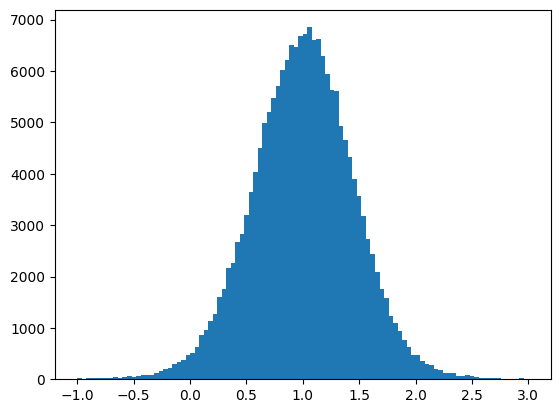

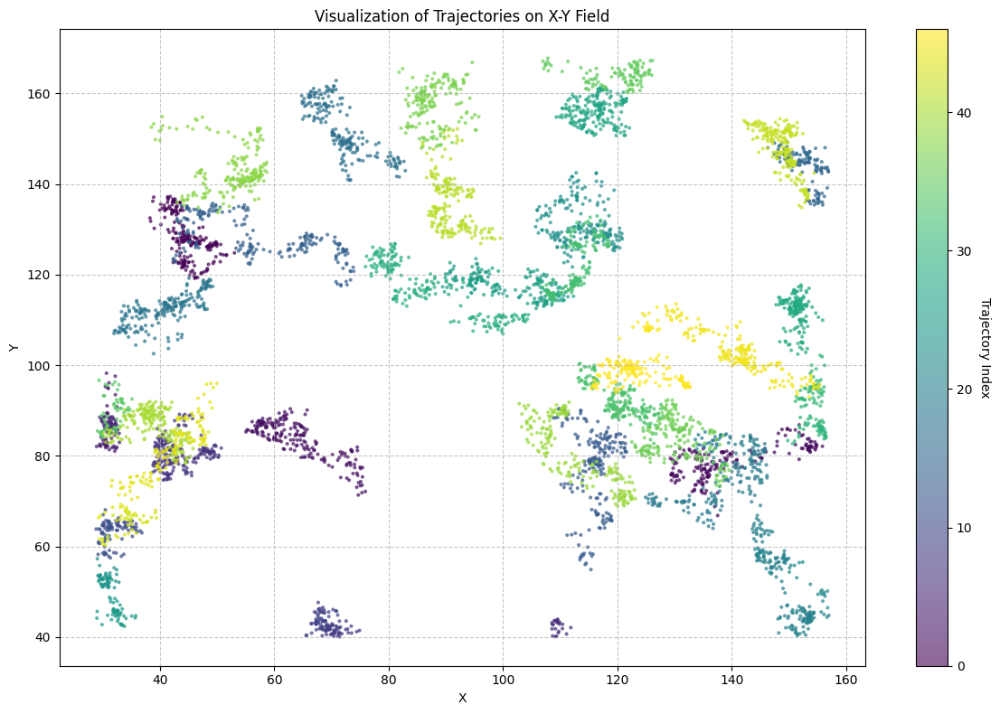

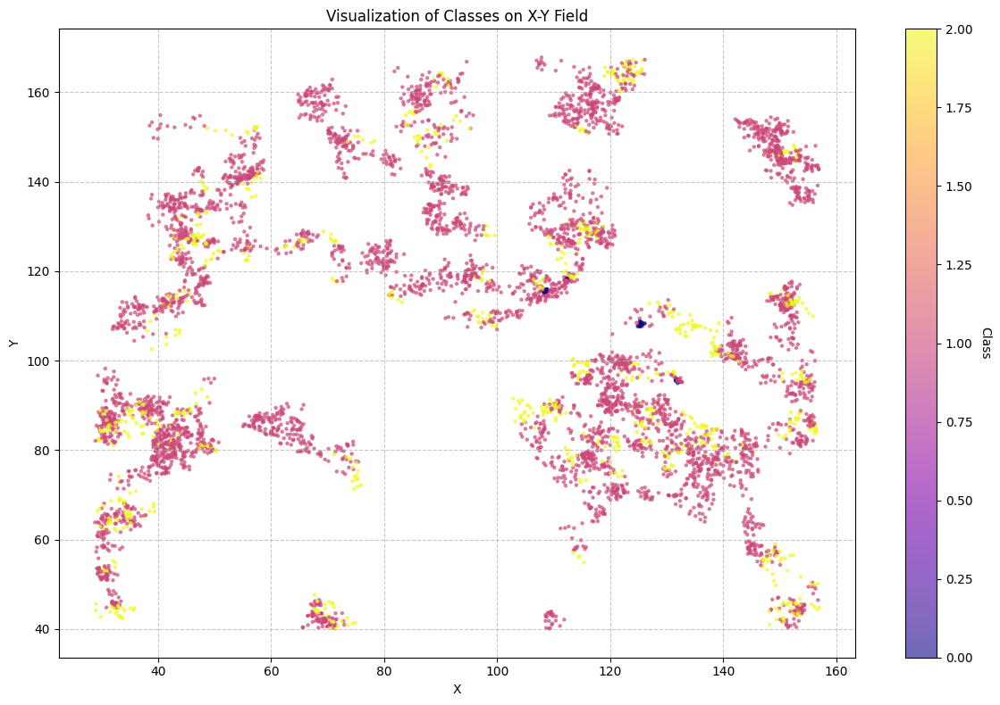

(5040, 203)
col=1


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([0.81368923 0.868779   0.7908597  ...        nan        nan        nan], shape=(1680,), dtype=float32) [0.85122623 0.86850892 0.82789496 ...        nan        nan        nan]
col = 1, % = 75.958961 T=109.598270
col=2


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([1.2745829 1.2342032 1.2074524 ...       nan       nan       nan], shape=(1680,), dtype=float32) [1.29319633 1.14626368 1.09245078 ...        nan        nan        nan]
col = 2, % = 22.034305 T=33.671940
col=0


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([nan nan nan ... nan nan nan], shape=(1680,), dtype=float32) [nan nan nan ... nan nan nan]
col = 0, % = 2.006735 T=24.071895
exp=2
msd1 anderson_results1 mean 9.35410273477564  std 11.394166127300952   max 84.61438977088773  q95 33.85294962810441
msd2 anderson_results2 mean 10.675610899520663  std 13.888613434489317   max 120.45852807084634  q95 39.66884921322972
msd3 anderson_results3 mean 10.588001149305068  std 14.511922511277747   max 137.68827653397898  q95 40.81182574323806
msd4 anderson_results4 mean 10.324180961022025  std 14.67452821619196   max 154.98240858594494  q95 40.583304636997084
Points in fov =  47717
161 32
dist% 0.28973551894102706
div% 0.6031720831051399
d+r% 0.27640513755695123
Model type predicted: dimerization


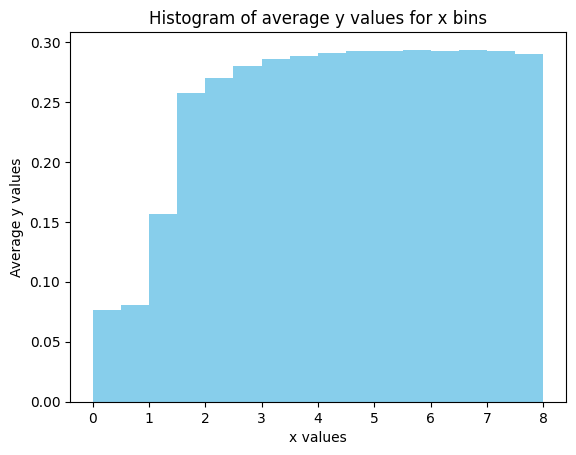

r_min=1.2011653706038625, y_tr=0.18426958106120406


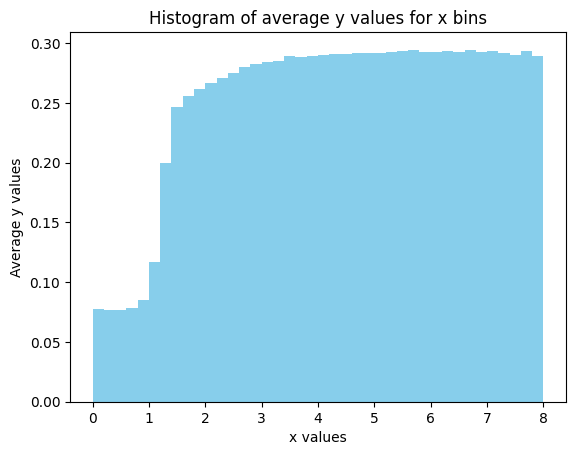

big_df1['class'].unique() [1 0] 


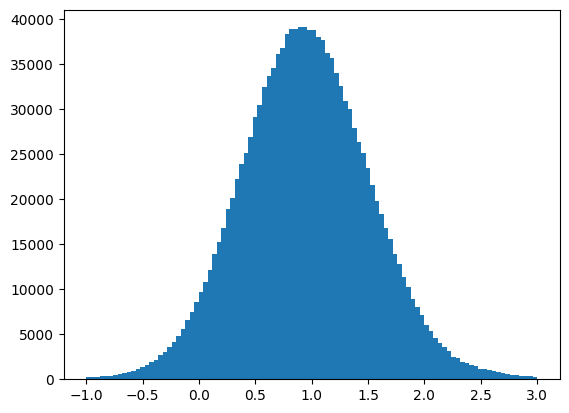

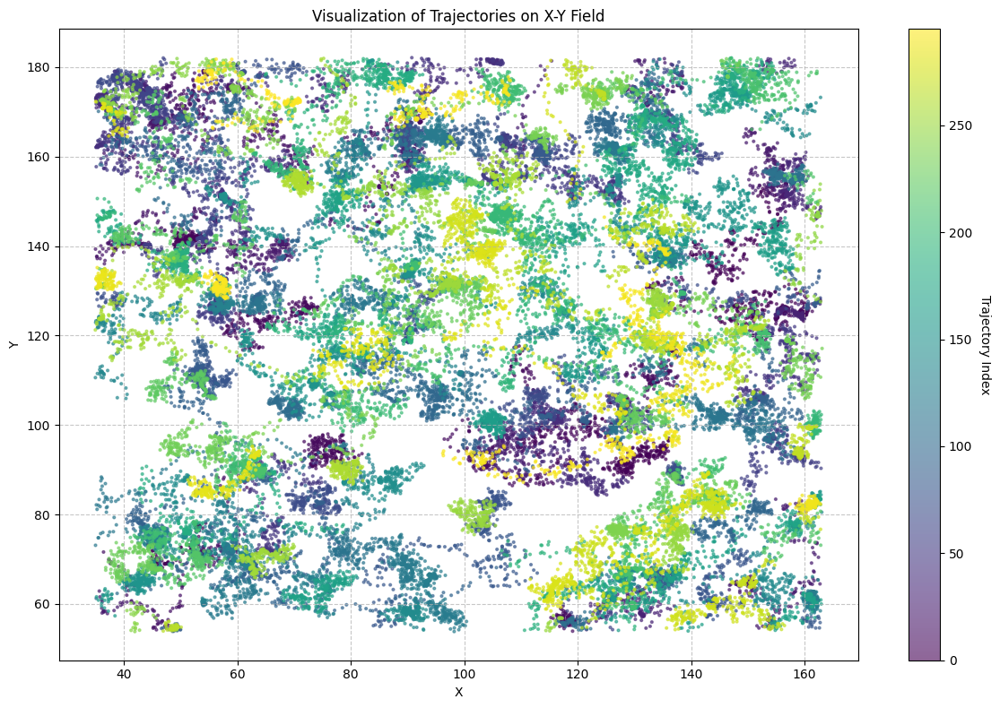

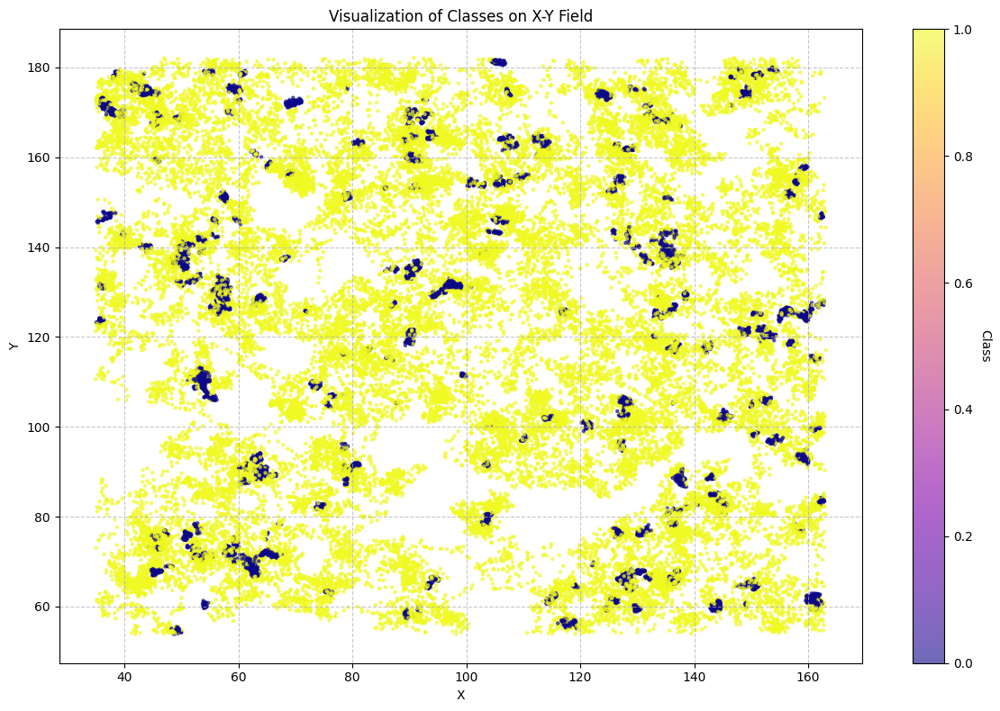

(20460, 203)
col=1


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([1.2608048  1.081643   0.68757665 ...        nan        nan        nan], shape=(10230,), dtype=float32) [1.2461409  0.99480603 0.6460755  ...        nan        nan        nan]
col = 1, % = 76.071004 T=116.799061
col=0


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([0.756574  1.1277854       nan ...       nan       nan       nan], shape=(10230,), dtype=float32) [0.6785515  0.93009389        nan ...        nan        nan        nan]
col = 0, % = 23.928996 T=47.508676
exp=3
msd1 anderson_results1 mean 13.104720607593325  std 32.03316266123042   max 210.28005991097905  q95 90.49129561037772
msd2 anderson_results2 mean 17.129027442681174  std 42.48148502272326   max 267.59657570845934  q95 116.04416002585317
msd3 anderson_results3 mean 19.33197143993697  std 48.717353906927904   max 302.173600001429  q95 130.17745228158267
msd4 anderson_results4 mean 20.93881804481465  std 53.267324082573836   max 333.2506448317765  q95 142.4639616954984
Points in fov =  4658
139 91
dist% 0.0006298314309651276
div% 0.6748168438315142
d+r% 0.0006298314309651276
Model type predicted: immobile_traps
0
k=1 minimum=0.06658022061562557 peaks [0.00841017 0.74411876]   rolling_median1_9
1
k=1 minimum=0.06658022061562557 peaks [0.00841017 1.05050705]   rolling_media

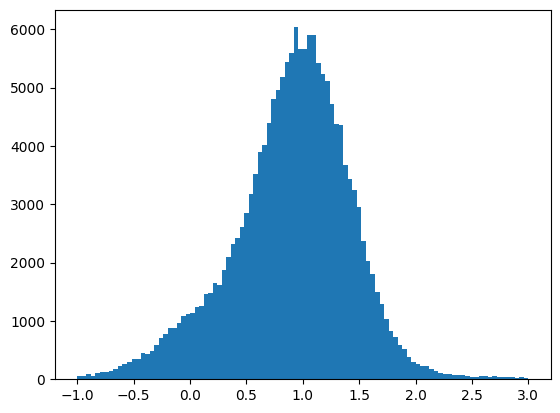

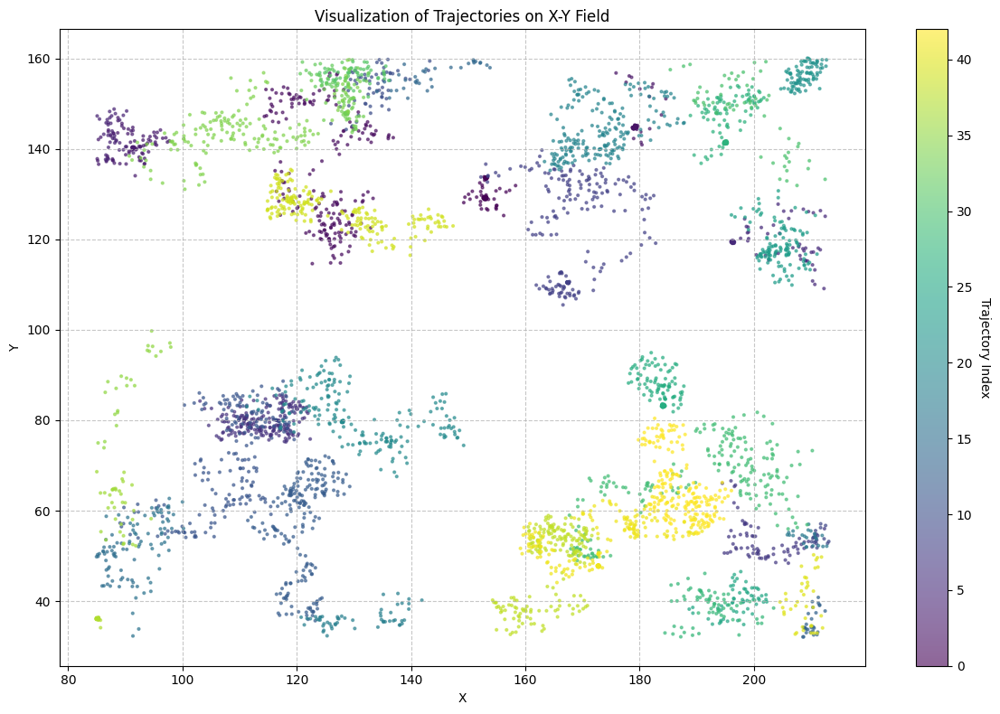

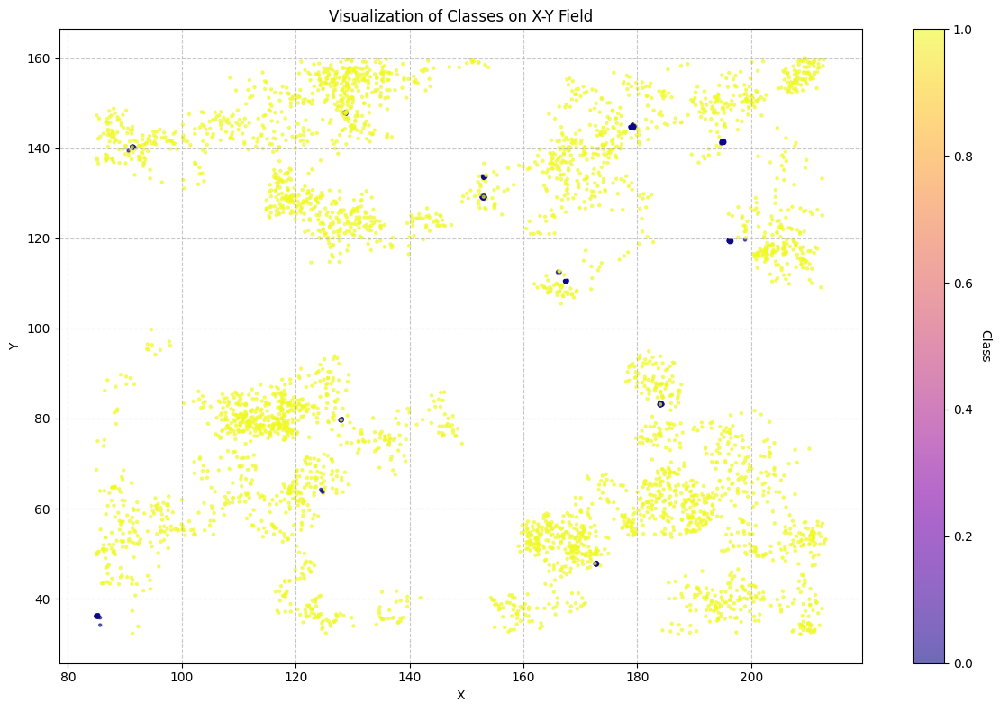

(3540, 203)
col=1


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([0.9824361  0.9977198  0.99406487 ...        nan        nan        nan], shape=(1770,), dtype=float32) [0.90770137 0.97622921 1.02004782 ...        nan        nan        nan]
col = 1, % = 85.750955 T=111.614849
col=0


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([0.76433265        nan 0.88290536 ...        nan        nan        nan], shape=(1770,), dtype=float32) [0.00739245        nan 0.07875184 ...        nan        nan        nan]
col = 0, % = 14.249045 T=58.490244
exp=4
msd1 anderson_results1 mean 33.62685681568759  std 43.2033493403264   max 224.07819746975696  q95 124.65143458036671
msd2 anderson_results2 mean 53.53650166921127  std 64.71227927575951   max 333.3787144177013  q95 183.27031566535612
msd3 anderson_results3 mean 66.29237545362322  std 78.22251663463423   max 403.0212597435386  q95 219.3470446780585
msd4 anderson_results4 mean 76.45424614544514  std 88.27806781691643   max 475.28423201321584  q95 248.16967578890475
Points in fov =  4272
388 186
dist% 0.18855345295824014
div% 0.6171839709155823
d+r% 0.1782291377536859
Model type predicted: immobile_traps
0
k=1 minimum=0.13269625482877112 peaks [0.02366329 0.74411876]   rolling_median1_9
1
2
k=1 minimum=0.13269625482877112 peaks [0.03340656 0.74411876]   rolling_media

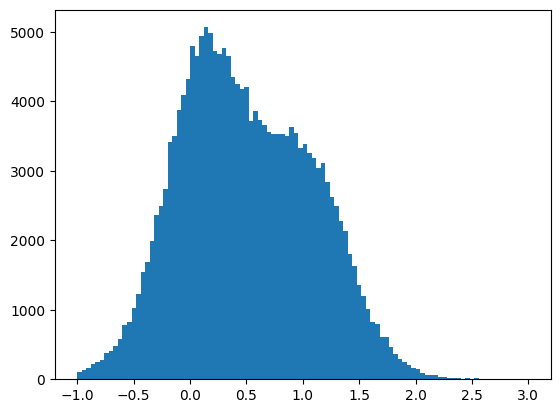

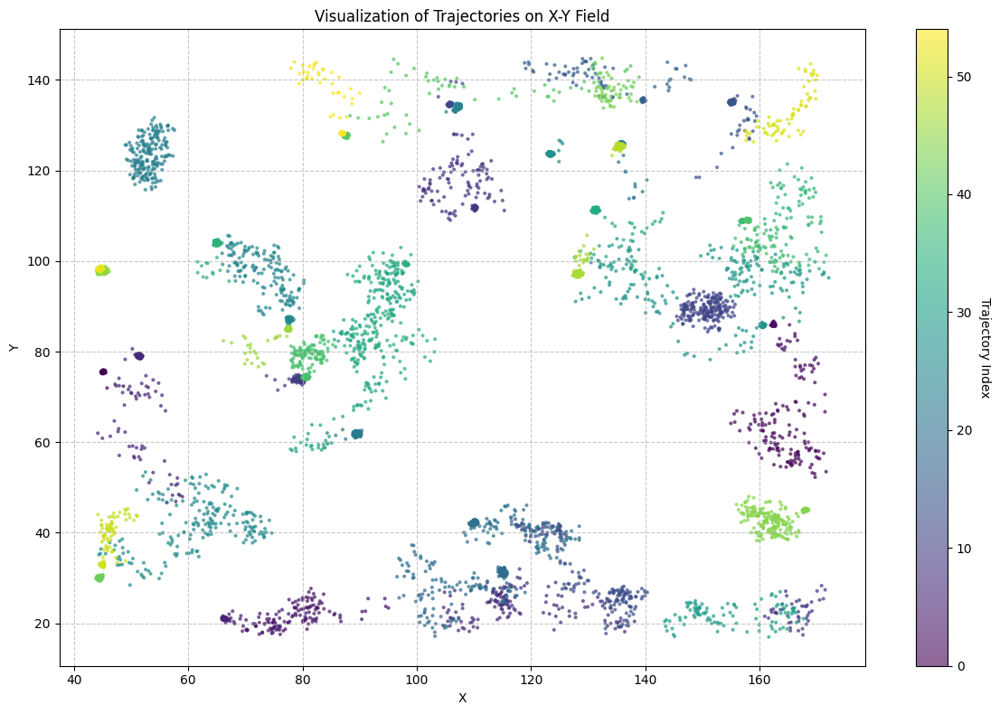

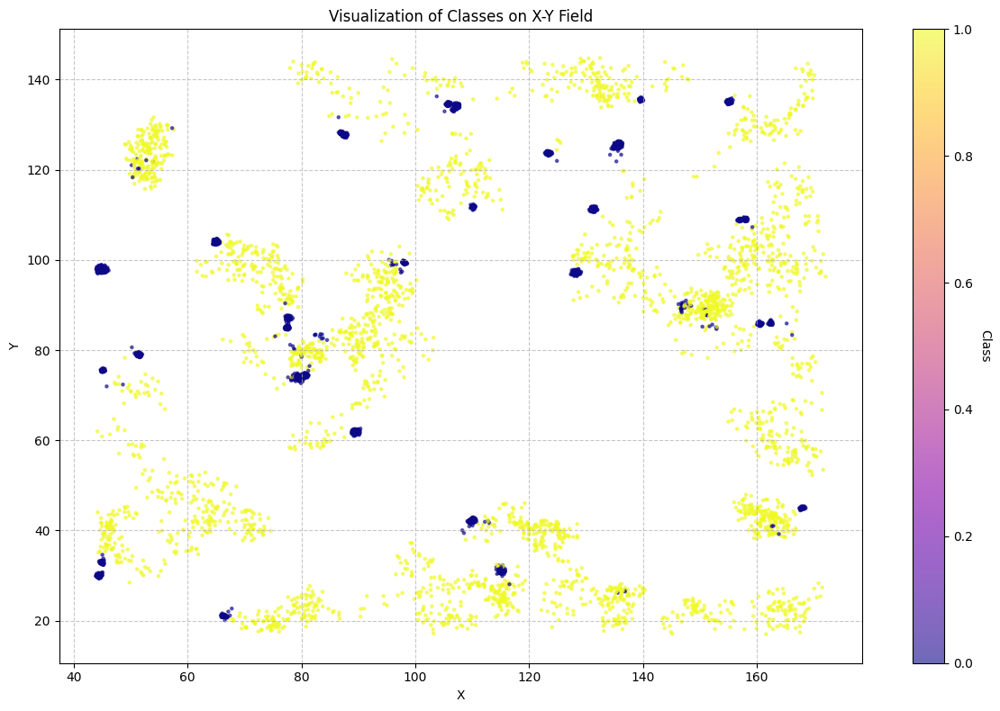

(3300, 203)
col=0


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([0.64821           nan 0.80019623 ...        nan        nan        nan], shape=(1650,), dtype=float32) [0.13723048        nan 0.20846576 ...        nan        nan        nan]
col = 0, % = 58.168835 T=126.485207
col=1


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([       nan 0.9035722  0.84122205 ...        nan        nan        nan], shape=(1650,), dtype=float32) [       nan 0.9203503  0.80477126 ...        nan        nan        nan]
col = 1, % = 41.831165 T=73.692234
exp=5
msd1 anderson_results1 mean 22.018092474074354  std 31.946104215283963   max 215.17557559486482  q95 87.51253924903044
msd2 anderson_results2 mean 31.921559689675874  std 45.76204127129276   max 267.05597265365134  q95 129.43262937239564
msd3 anderson_results3 mean 37.768455499424014  std 54.12315290051046   max 335.6610752106336  q95 153.4510223647347
msd4 anderson_results4 mean 41.781570075755354  std 60.07140128412107   max 370.1087915964306  q95 173.41117380446195
Points in fov =  29923
252 65
dist% 0.31824846670159385
div% 0.5774390018162869
d+r% 0.316598214676361
Model type predicted: dimerization


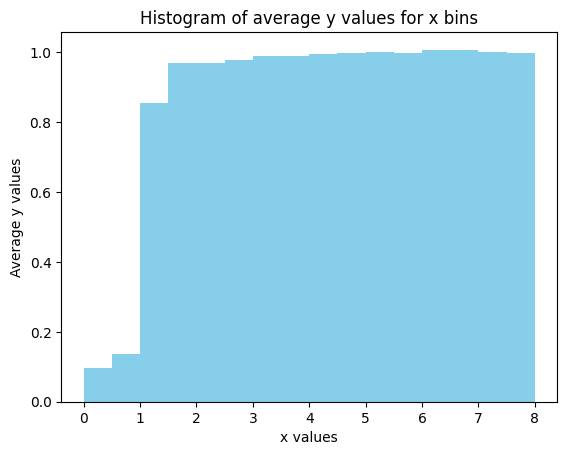

r_min=1.000899831229758, y_tr=0.5481727654972015


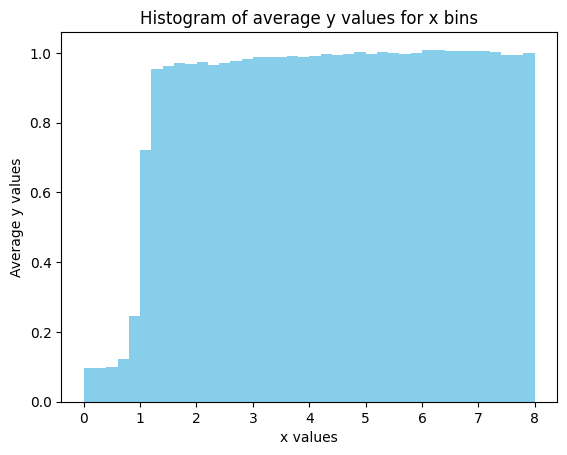

big_df1['class'].unique() [1 0] 


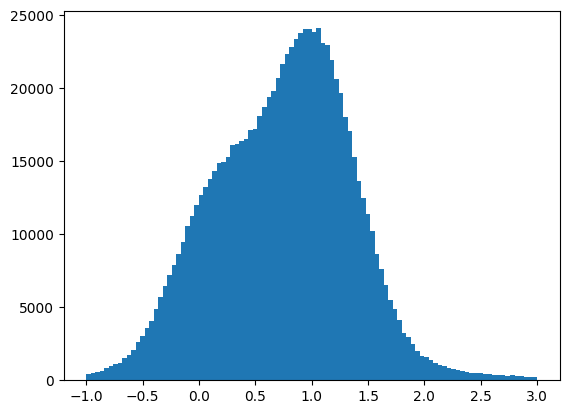

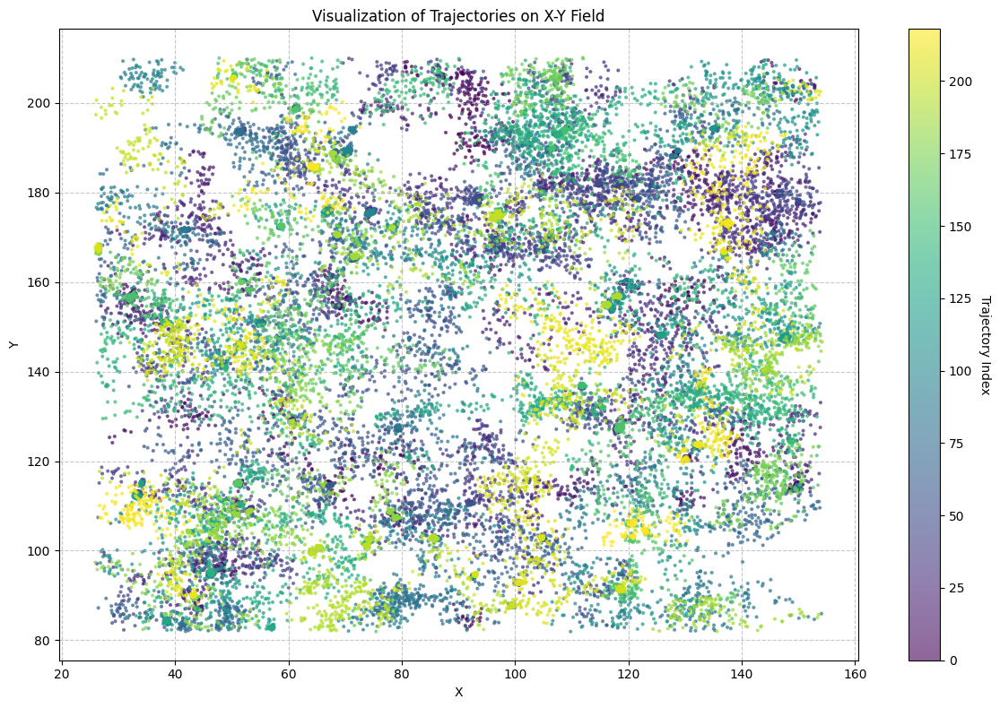

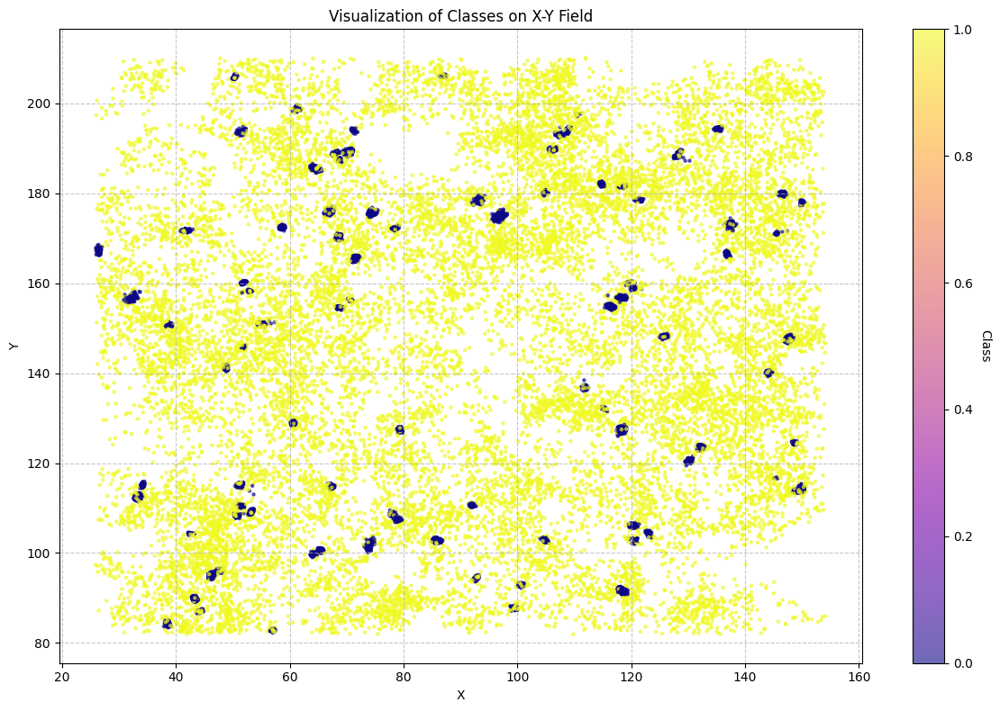

(14400, 203)
col=1


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([0.8033659  1.0093035  0.99004793 ... 0.8046039  1.0880134  1.0442997 ], shape=(7200,), dtype=float32) [0.75819571 0.99288975 0.90431274 ... 0.72173194 1.08449681 1.01265328]
col = 1, % = 69.215339 T=96.176306
col=0


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([       nan 0.20440963        nan ... 0.590212          nan 0.16932106], shape=(7200,), dtype=float32) [       nan 0.001             nan ... 0.00812867        nan 0.10726943]
col = 0, % = 30.784661 T=71.572248
exp=6
msd1 anderson_results1 mean 2.2920376900100714  std 7.566873567074562   max 103.91357792270219  q95 9.536523700290747
msd2 anderson_results2 mean 3.2970927640685543  std 11.042582932090983   max 156.63070993367342  q95 14.50103668567141
msd3 anderson_results3 mean 4.225724156136665  std 14.485738880074665   max 226.4134589854657  q95 18.38990451044837
msd4 anderson_results4 mean 5.586421895572776  std 19.279783197104468   max 283.8084636583154  q95 26.275727481685447
Points in fov =  5649
344 284
dist% 0.14474005508390358
div% 0.11443822936483149
d+r% 0.07343195434282632
Model type predicted: dimerization


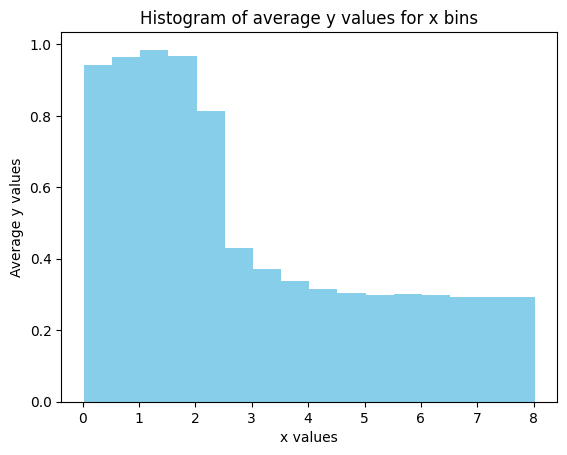

r_min=2.4201669874097855, y_tr=0.6172653303934157


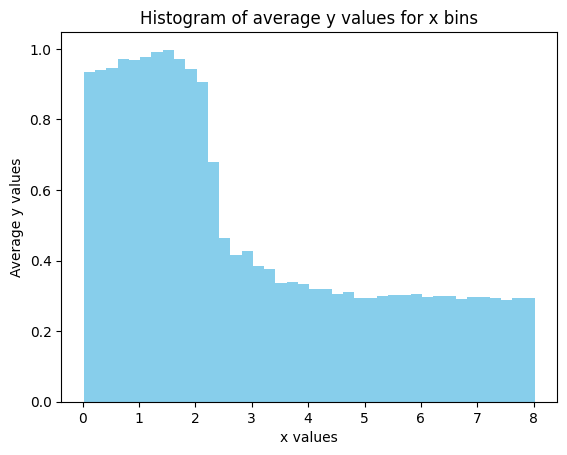

big_df1['class'].unique() [1 0] 


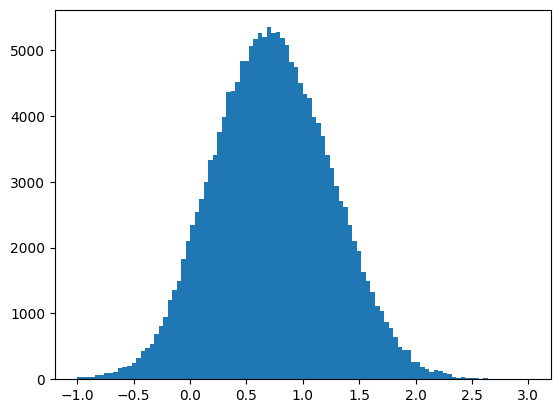

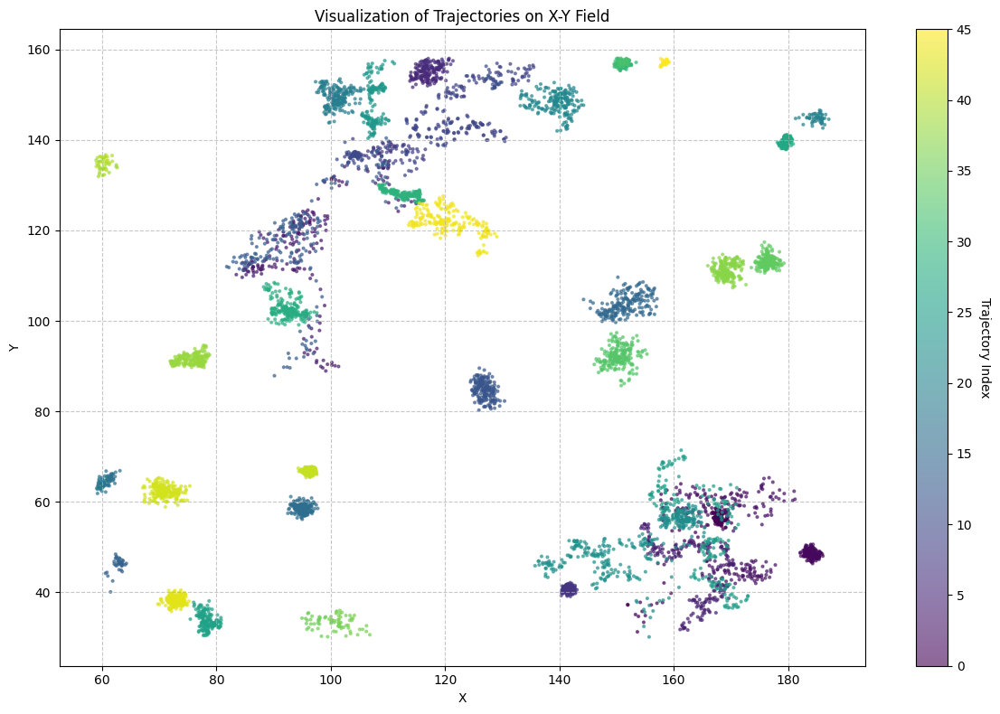

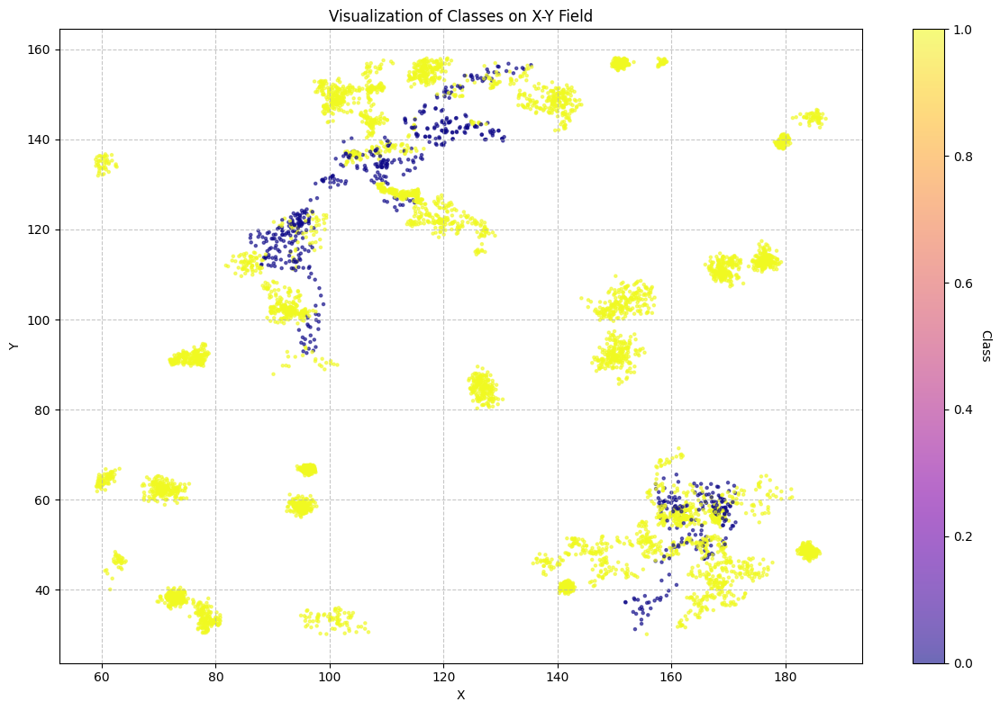

(3120, 203)
col=1


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([0.8133684 0.5206201 0.7849459 ...       nan       nan       nan], shape=(1560,), dtype=float32) [0.86689143 0.50636985 0.75684477 ...        nan        nan        nan]
col = 1, % = 88.077458 T=134.986945
col=0


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([1.3183993       nan 1.301486  ...       nan       nan       nan], shape=(1560,), dtype=float32) [1.2959758         nan 1.28335202 ...        nan        nan        nan]
col = 0, % = 11.922542 T=52.356608
exp=7
msd1 anderson_results1 mean 10.134082031604398  std 21.76071441322   max 171.91342316134057  q95 48.48941888106559
msd2 anderson_results2 mean 16.109349521281718  std 31.232696840954205   max 241.56848830536524  q95 72.71994305838109
msd3 anderson_results3 mean 20.130801491633285  std 36.723265728073315   max 296.8838604525722  q95 92.45374473646139
msd4 anderson_results4 mean 23.01713428564461  std 40.16378358190869   max 328.5362511446243  q95 102.17642711030288
Points in fov =  6194
278 78
dist% 0.00015927099390788447
div% 0.7506214412887299
d+r% 0.00010238849608364002
Model type predicted: multi_state
0
k=4 extr=0.2644673730842175
1
k=4 extr=0.13269625482877112
2
k=4 extr=0.06658022061562557
3
k=4 extr=0.09399439303153592
4
k=4 extr=0.09399439303153592
5
k=2 extr=0.

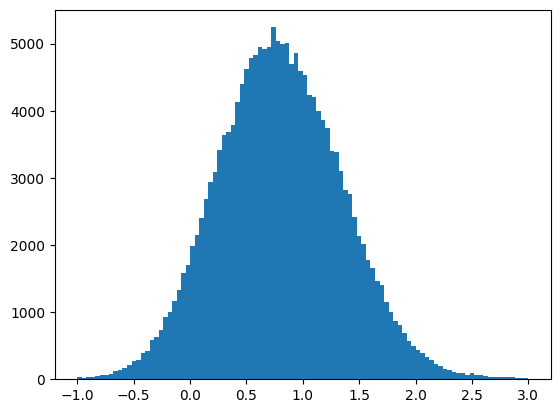

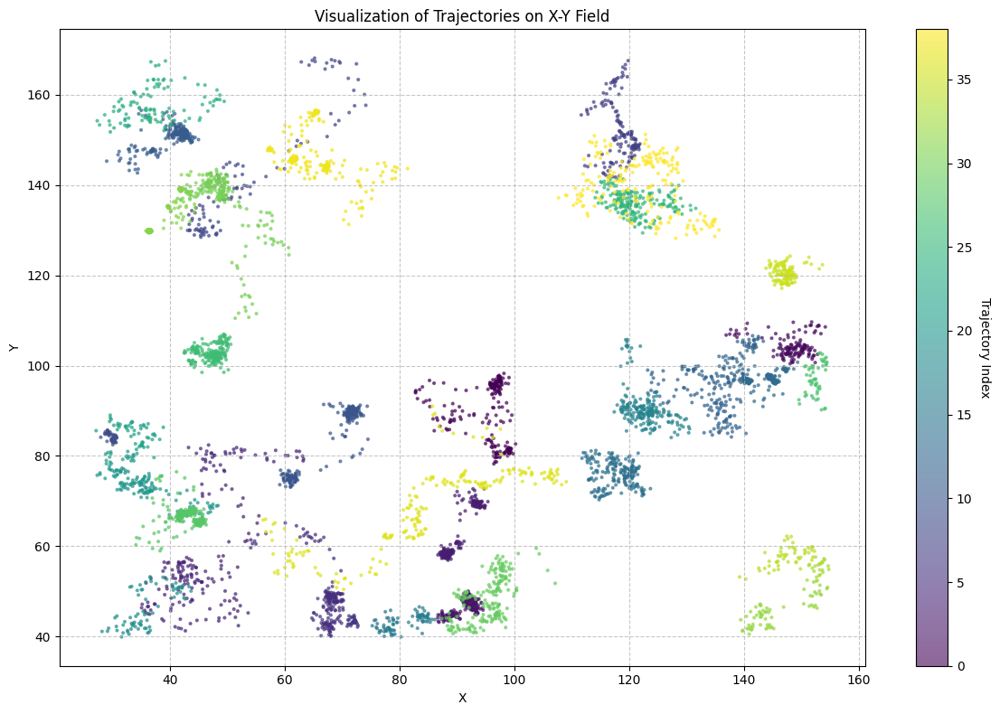

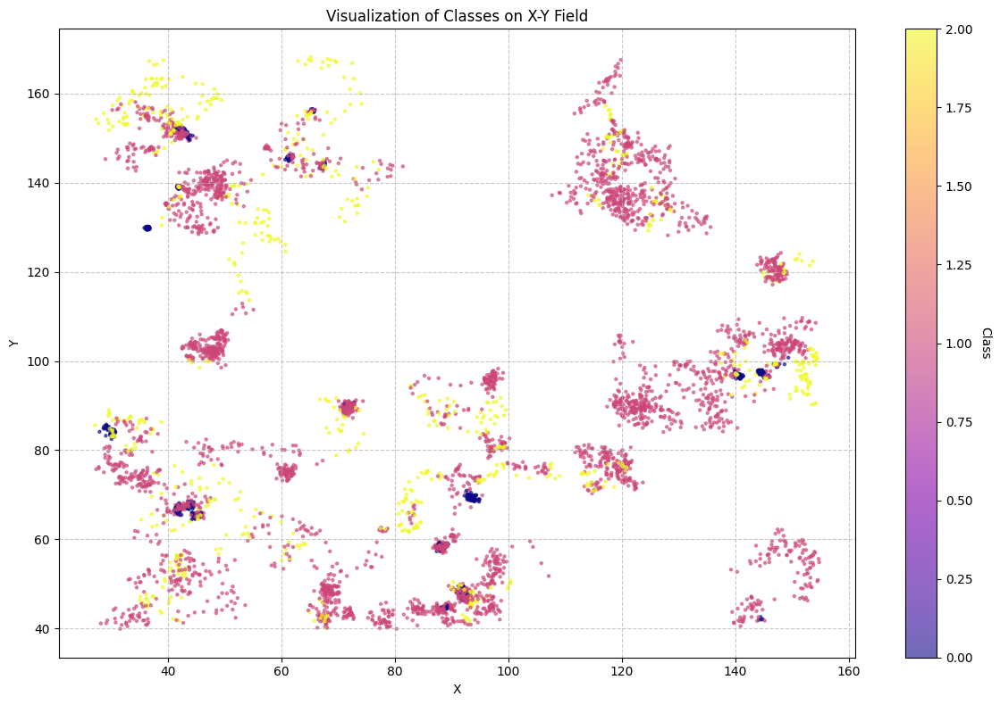

(5310, 203)
col=1


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([0.99003047 0.85026807 0.915122   ...        nan        nan        nan], shape=(1770,), dtype=float32) [0.90255031 0.8128049  0.92750029 ...        nan        nan        nan]
col = 1, % = 76.899449 T=111.175987
col=2


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([1.4862188       nan 1.3067862 ...       nan       nan       nan], shape=(1770,), dtype=float32) [1.26306898        nan 1.1232058  ...        nan        nan        nan]
col = 2, % = 16.295698 T=26.823970
col=0


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([       nan        nan 0.76390576 ...        nan        nan        nan], shape=(1770,), dtype=float32) [     nan      nan 0.701724 ...      nan      nan      nan]
col = 0, % = 6.804853 T=55.384259
exp=8
msd1 anderson_results1 mean 0.7022230914304024  std 0.8852225703146667   max 16.07746838625704  q95 1.5593416389438763
msd2 anderson_results2 mean 1.2297499236715106  std 6.917461466202731   max 169.5451926345479  q95 2.219173032427957
msd3 anderson_results3 mean 1.269147546085681  std 4.677600176827237   max 130.3649784337219  q95 2.5966967633912676
msd4 anderson_results4 mean 2.222957471641616  std 9.583432794844384   max 150.71785490639712  q95 4.573619445242674
Points in fov =  3312
171 1
dist% 0.0
div% 0.24597882165735704
d+r% 0.0
Model type predicted: single_state
big_df1['class'].unique() [0] 


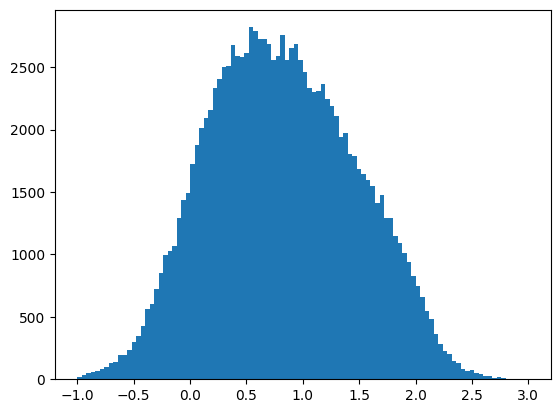

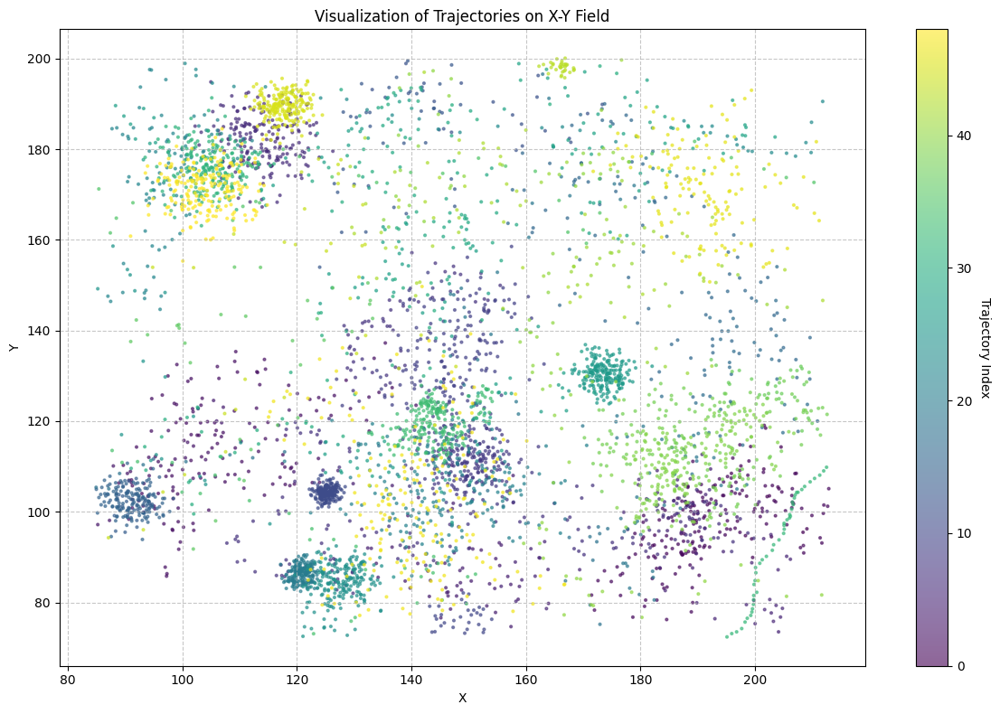

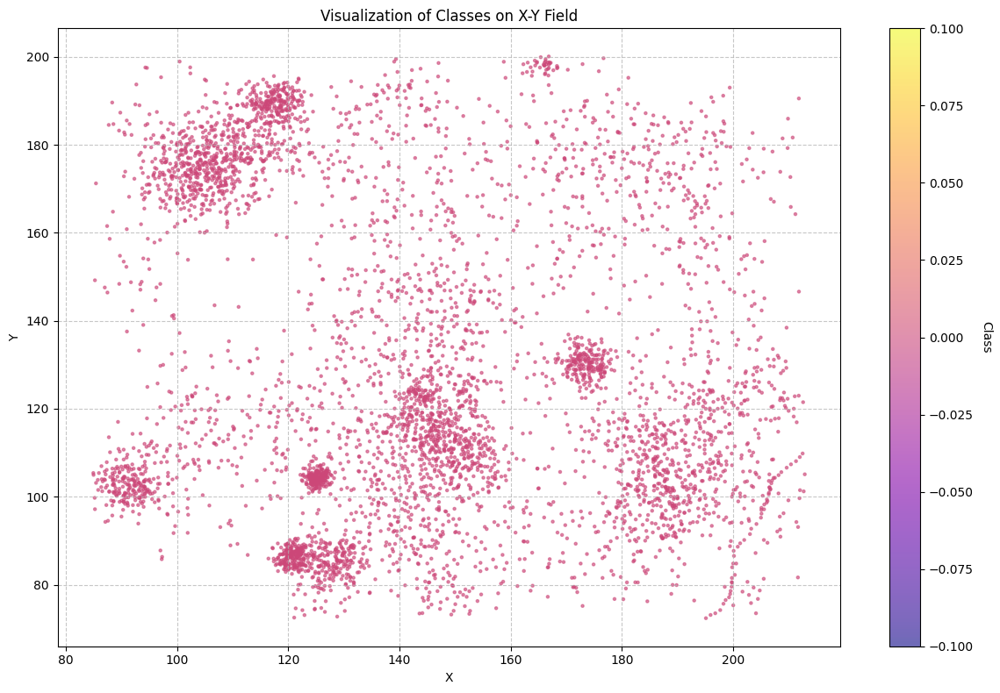

(1920, 203)
col=0


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([0.69047236 0.5820652  0.8998574  ...        nan        nan        nan], shape=(1920,), dtype=float32) [0.80535021 0.67839301 0.97107478 ...        nan        nan        nan]
col = 0, % = 100.000000 T=79.998031
exp=9
msd1 anderson_results1 mean 20.354576428827052  std 20.33341462548245   max 147.23137592914554  q95 59.732106471422966
msd2 anderson_results2 mean 23.56114513825316  std 24.159214005830002   max 168.4482947575499  q95 71.14075848153296
msd3 anderson_results3 mean 22.44978580191641  std 23.774500162689595   max 169.6626985032242  q95 69.05711765360905
msd4 anderson_results4 mean 20.42326257162559  std 22.1939160698973   max 153.37417438654438  q95 62.74787609057016
Points in fov =  6092
147 27
dist% 0.039943824951299854
div% 0.6849214002342784
d+r% 0.030850974326449516
Model type predicted: immobile_traps
0
k=1 minimum=0.06658022061562557 peaks [0.01187303 0.74411876]   rolling_median1_9
1
k=1 minimum=0.06658022061562557 peaks [0.02366329 0.74411876]   rolling_med

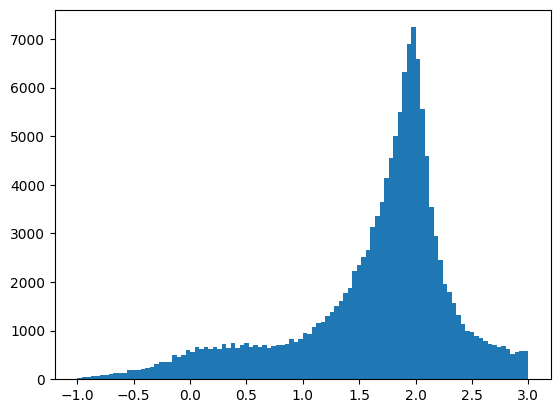

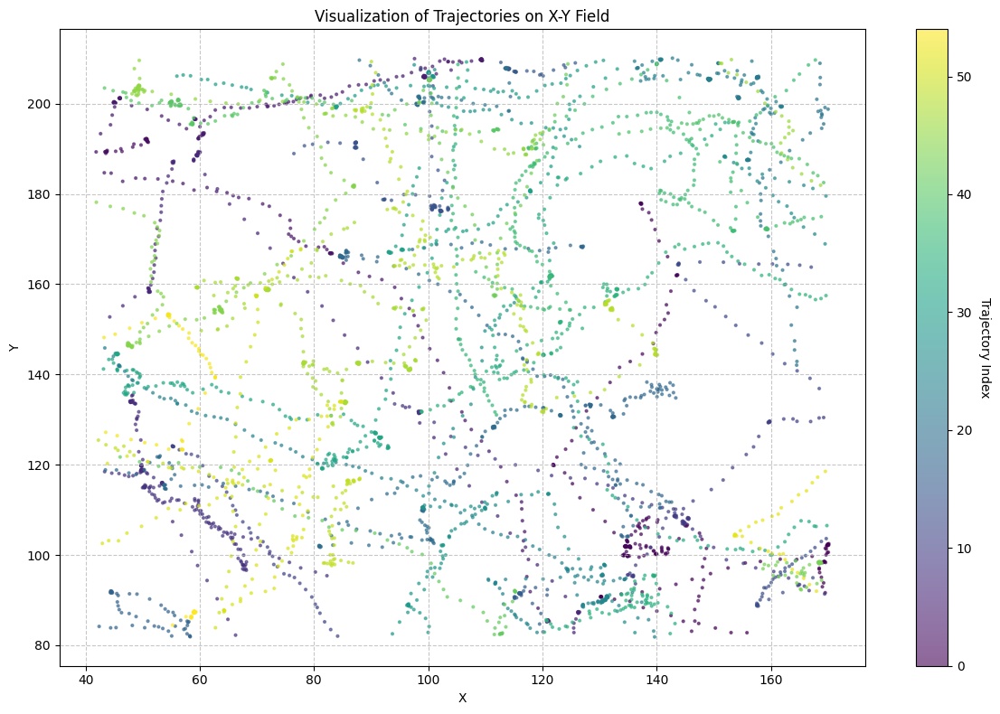

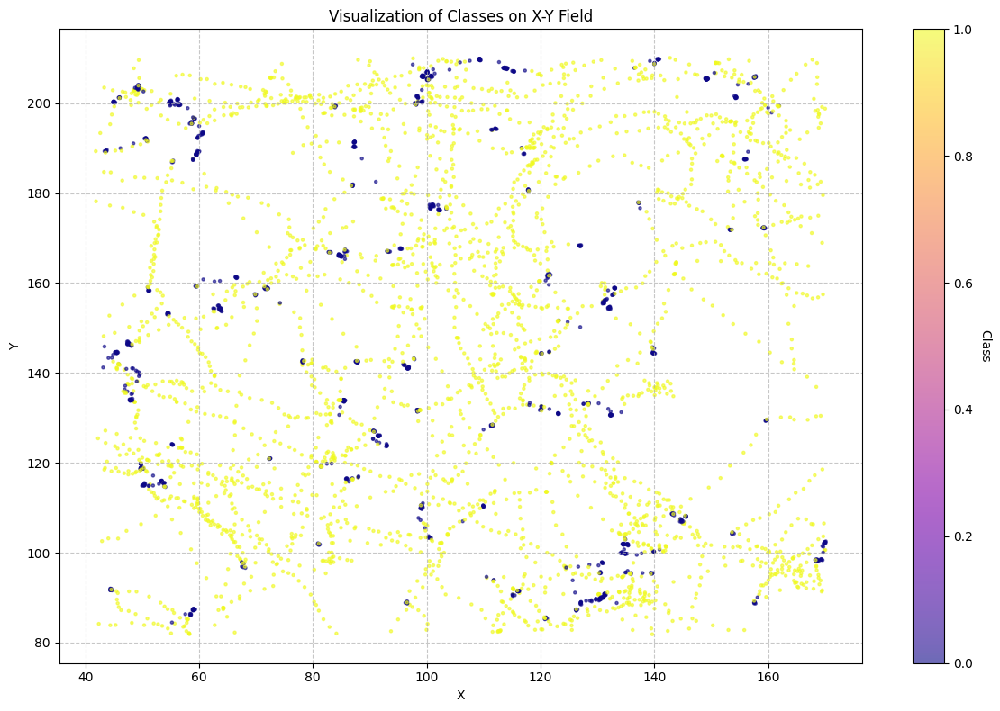

(4680, 203)
col=1


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([1.9764795 1.8628454 1.8546549 ...       nan       nan       nan], shape=(2340,), dtype=float32) [1.999      1.85469989 1.9693923  ...        nan        nan        nan]
col = 1, % = 42.588194 T=61.271881
col=0


/tmp/ipykernel_18/3649110385.py:173: RuntimeWarning: Mean of empty slice
  tamsd[:,idx] = np.nanmean(self.trim_array1s(((trajs[:, tlag:, :]-trajs[:, :-tlag, :])**2).sum(-1)), axis=-1)


tf.Tensor([1.9559616 1.4758134 2.2939622 ...       nan       nan       nan], shape=(2340,), dtype=float32) [1.79903117 0.92330786 1.97941215 ...        nan        nan        nan]
col = 0, % = 57.411806 T=53.472574


In [28]:
layer = TAMSDalpha(use_correction=True, trim_percent=0)


tamsd_est = ta_msd()
# We only track 2 in this example
track = 2

# Predefined model type predictions for each experiment
model_type_predictions = []

import os

# Set up the results directory
path_results = '/kaggle/working/res/'
if not os.path.exists(path_results):
    os.makedirs(path_results)

# Create the folder for the specific track if it doesn't exist
path_track = path_results + f'track_{track}/'
if not os.path.exists(path_track):
    os.makedirs(path_track)


# Loop through each experiment
for exp in range(EXP1, N_EXP + EXP1):
    # Create a directory for each experiment
    path_exp = path_track + f'exp_{exp}/'
    if not os.path.exists(path_exp):
        os.makedirs(path_exp)
    
    # Initialize an empty DataFrame to store all FOV data for this experiment
    big_df1 = pd.DataFrame()

    # Loop through each Field of View (FOV)
    for fov in range(N_FOVS):
        # Read the corresponding csv file from the public data
        df = pd.read_csv(public_data_path+f'/track_2/exp_{exp}/trajs_fov_{fov}.csv')
        df.sort_values(by=['traj_idx', 'frame'], inplace=True)
        df['fov'] = fov

        # Add minimum distance column
        df = add_min_distance_column(df)

        # Calculate differences in x and y coordinates for various time lags
        df['x_diff'] = df.groupby('traj_idx')['x'].diff(-1).ffill().bfill()
        df['y_diff'] = df.groupby('traj_idx')['y'].diff(-1).ffill().bfill()

        df['x_diff2'] = df.groupby('traj_idx')['x'].diff(-2).shift(-1).ffill().bfill()
        df['y_diff2'] = df.groupby('traj_idx')['y'].diff(-2).shift(-1).ffill().bfill()

        df['x_diff3'] = df.groupby('traj_idx')['x'].diff(-3).shift(-1).ffill().bfill()
        df['y_diff3'] = df.groupby('traj_idx')['y'].diff(-3).shift(-1).ffill().bfill()

        df['x_diff4'] = df.groupby('traj_idx')['x'].diff(-4).shift(-2).ffill().bfill()
        df['y_diff4'] = df.groupby('traj_idx')['y'].diff(-4).shift(-2).ffill().bfill()
        
        # Calculate Mean Squared Displacements (MSD) for different time lags
        df['msd1'] = (df['x_diff'] ** 2 + df['y_diff'] ** 2) / 4
        df['msd2'] = (df['x_diff2'] ** 2 + df['y_diff2'] ** 2) / 4
        df['msd3'] = (df['x_diff3'] ** 2 + df['y_diff3'] ** 2) / 4
        df['msd4'] = (df['x_diff4'] ** 2 + df['y_diff4'] ** 2) / 4
        
        # Calculate rolling medians and means for different window sizes
        df['rolling_median1_7'] = df.groupby('traj_idx')['msd1'].rolling(window=7, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_median1_9'] = df.groupby('traj_idx')['msd1'].rolling(window=9, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_mean1_9'] = df.groupby('traj_idx')['msd1'].rolling(window=9, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_median1_11'] = df.groupby('traj_idx')['msd1'].rolling(window=11, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_mean1_11'] = df.groupby('traj_idx')['msd1'].rolling(window=11, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_median1_15'] = df.groupby('traj_idx')['msd1'].rolling(window=15, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_mean1_15'] = df.groupby('traj_idx')['msd1'].rolling(window=15, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_mean1'] = df.groupby('traj_idx')['msd1'].rolling(window=5, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_median1'] = df.groupby('traj_idx')['msd1'].rolling(window=5, min_periods=1, center=True).median().reset_index(level=0, drop=True)

        # Repeat rolling calculations for msd2
        df['rolling_median2_7'] = df.groupby('traj_idx')['msd2'].rolling(window=7, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_median2_9'] = df.groupby('traj_idx')['msd2'].rolling(window=9, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_mean2_9'] = df.groupby('traj_idx')['msd2'].rolling(window=9, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_median2_11'] = df.groupby('traj_idx')['msd2'].rolling(window=11, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_mean2_11'] = df.groupby('traj_idx')['msd2'].rolling(window=11, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_median2_15'] = df.groupby('traj_idx')['msd2'].rolling(window=15, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_mean2_15'] = df.groupby('traj_idx')['msd2'].rolling(window=15, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_mean2'] = df.groupby('traj_idx')['msd2'].rolling(window=5, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_median2'] = df.groupby('traj_idx')['msd2'].rolling(window=5, min_periods=1, center=True).median().reset_index(level=0, drop=True)

        # Repeat rolling calculations for msd3
        df['rolling_median3_7'] = df.groupby('traj_idx')['msd3'].rolling(window=7, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_median3_9'] = df.groupby('traj_idx')['msd3'].rolling(window=9, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_mean3_9'] = df.groupby('traj_idx')['msd3'].rolling(window=9, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_median3_11'] = df.groupby('traj_idx')['msd3'].rolling(window=11, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_mean3_11'] = df.groupby('traj_idx')['msd3'].rolling(window=11, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_median3_15'] = df.groupby('traj_idx')['msd3'].rolling(window=15, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_mean3_15'] = df.groupby('traj_idx')['msd3'].rolling(window=15, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_mean3'] = df.groupby('traj_idx')['msd3'].rolling(window=5, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_median3'] = df.groupby('traj_idx')['msd3'].rolling(window=5, min_periods=1, center=True).median().reset_index(level=0, drop=True)

        # Repeat rolling calculations for msd4
        df['rolling_median4_7'] = df.groupby('traj_idx')['msd4'].rolling(window=7, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_median4_9'] = df.groupby('traj_idx')['msd4'].rolling(window=9, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_mean4_9'] = df.groupby('traj_idx')['msd4'].rolling(window=9, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_median4_11'] = df.groupby('traj_idx')['msd4'].rolling(window=11, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_mean4_11'] = df.groupby('traj_idx')['msd4'].rolling(window=11, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_median4_15'] = df.groupby('traj_idx')['msd4'].rolling(window=15, min_periods=1, center=True).median().reset_index(level=0, drop=True)
        df['rolling_mean4_15'] = df.groupby('traj_idx')['msd4'].rolling(window=15, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_mean4'] = df.groupby('traj_idx')['msd4'].rolling(window=5, min_periods=1, center=True).mean().reset_index(level=0, drop=True)
        df['rolling_median4'] = df.groupby('traj_idx')['msd4'].rolling(window=5, min_periods=1, center=True).median().reset_index(level=0, drop=True)

        # Calculate rolling alpha
        df['rolling_alpha'] = np.log(df['rolling_median4_15'] / df['rolling_median1_15']) / np.log(4)
        
        # Concatenate the current dataframe to the main dataframe
        big_df1 = pd.concat([big_df1, df], ignore_index=True)

    # Convert 'frame' and 'traj_idx' columns to int32
    big_df1.frame = big_df1.frame.astype(np.int32)
    big_df1.traj_idx = big_df1.traj_idx.astype(np.int32)

    # Initialize 'class' column
    big_df1['class'] = 0

    print(f"exp={exp}")
    
    # Apply Anderson statistic to msd1, msd2, msd3, and msd4 and gather results
    anderson_results1 = big_df1.groupby(['traj_idx', 'fov'])['msd1'].apply(anderson_statistic).dropna().values
    anderson_results2 = big_df1.groupby(['traj_idx', 'fov'])['msd2'].apply(anderson_statistic).dropna().values
    anderson_results3 = big_df1.groupby(['traj_idx', 'fov'])['msd3'].apply(anderson_statistic).dropna().values
    anderson_results4 = big_df1.groupby(['traj_idx', 'fov'])['msd4'].apply(anderson_statistic).dropna().values
    
    # Print Anderson statistic results
    print(f"msd1 anderson_results1 mean {anderson_results1.mean()}  std {anderson_results1.std()}   max {anderson_results1.max()}  q95 {np.quantile(anderson_results1, 0.95)}")
    print(f"msd2 anderson_results2 mean {anderson_results2.mean()}  std {anderson_results2.std()}   max {anderson_results2.max()}  q95 {np.quantile(anderson_results2, 0.95)}")
    print(f"msd3 anderson_results3 mean {anderson_results3.mean()}  std {anderson_results3.std()}   max {anderson_results3.max()}  q95 {np.quantile(anderson_results3, 0.95)}")
    print(f"msd4 anderson_results4 mean {anderson_results4.mean()}  std {anderson_results4.std()}   max {anderson_results4.max()}  q95 {np.quantile(anderson_results4, 0.95)}")

    # Predict the model type
    model_type_prediction = 'multi_state'  # Default model
    if check_conf(big_df1[big_df1.fov == 1]):
        model_type_prediction = 'confinement'
    if np.quantile(anderson_results1, 0.95) < 2.5 and np.quantile(anderson_results2, 0.95) < 2.5 and np.quantile(anderson_results3, 0.95) < 3:
        model_type_prediction = 'single_state'
    if check_trap(big_df1):
        model_type_prediction = 'immobile_traps'
    if check_dim(big_df1):
        model_type_prediction = 'dimerization'

    print(f"Model type predicted: {model_type_prediction}")
    model_type_predictions.append(model_type_prediction)

    
    # Re-initialize 'class' column
    big_df1['class'] = 0
    
    # Calculate rolling alpha for msd3
    big_df1['rolling_alpha_15'] = np.log(big_df1['rolling_median3_15'] / big_df1['rolling_median1_15']) / np.log(3)

                                                                      
    if model_type_prediction == 'dimerization':
        x = big_df1.dist.values
        y = big_df1.rolling_mean1_9.values

        bin_width = 0.5
        bins = np.arange(start=x.min(), stop=x.max() + bin_width, step=bin_width)
        indmax = len(bins) - 2
        
        
        indices = np.digitize(x, bins)  # Находит индексы корзин для каждого значения в x
        y_0 = np.nanmean(y[indices == 1])
        y_m = np.nanmean(y[indices == indmax])
        y_tr = (y_0 + y_m) * 0.5
        # Splitting x values into bins and calculating the average y values for each bin
        indices = np.digitize(x, bins)  # Finds bin indices for each value in x
        y_0 = np.nanmean(y[indices == 1])
        y_m = np.nanmean(y[indices == indmax])
        y_tr = (y_0 + y_m) * 0.5
        indices = np.digitize(x, bins)  # Finds bin indices for each value in x        
        y_means = [np.nanmean(y[indices == i]) for i in range(1, len(bins))]
        y_means = np.array(y_means)
        y_means = np.nan_to_num(y_means, nan=0.0)
        plt.bar(bins[:-1], y_means, width=bin_width, align='edge', color='skyblue')

        # Adding labels and title
        plt.xlabel('x values')
        plt.ylabel('Average y values')
        plt.title('Histogram of average y values for x bins')

        # Displaying the histogram
        plt.show()            

        bin_width = 0.2
        bins = np.arange(start=x.min(), stop=x.max() + bin_width, step=bin_width)

        # Splitting x values into bins and calculating the average y values for each bin
        indices = np.digitize(x, bins)  # Finds bin indices for each value in x
        y_means = [np.nanmean(y[indices == i]) for i in range(1, len(bins))]

        # Removing NaN values for bins with no x elements
        y_means = np.array(y_means)
        y_means = np.nan_to_num(y_means, nan=0.0)

        if y_0 < y_m:
            r_min = bins[np.argmax(y_means[1:] > y_tr) + 1] if np.any(np.array(y_means) > y_tr) else None
            new_col = (((x < r_min) + 0 + (y < y_tr) + 0) == 2) + 0
        else:
            r_min = bins[np.argmax(y_means[1:] < y_tr) + 1] if np.any(np.array(y_means) < y_tr) else None
            new_col = (((x < r_min) + 0 + (y > y_tr) + 0) == 2) + 0
        big_df1['class'] = fill_short_segments_np(1 - new_col, 3)

        plt.bar(bins[:-1], y_means, width=bin_width, align='edge', color='skyblue')
        print(f'r_min={r_min}, y_tr={y_tr}')
        # Adding labels and title
        plt.xlabel('x values')
        plt.ylabel('Average y values')
        plt.title('Histogram of average y values for x bins')

        # Displaying the histogram
        plt.show() 

    elif model_type_prediction == 'multi_state':
        for fov in range(N_FOVS):
            print(fov)
            if exp == 10:
                fov_class = div_by_rollstat(big_df1[big_df1['fov']==fov])
            else:
                fov_class = div_by_rollstat9(big_df1[big_df1['fov']==fov])
            big_df1.loc[big_df1['fov'] == fov, 'class'] = fov_class
    #         visualize_rolling_median(big_df1[big_df1['fov'] == fov])       

    elif model_type_prediction == 'immobile_traps':
        for fov in range(N_FOVS):
            print(fov)
            fov_class = divide_single_statistic_1only(big_df1[big_df1['fov'] == fov])
            big_df1.loc[big_df1['fov'] == fov, 'class'] = fov_class

    #         visualize_rolling_median(big_df1[big_df1['fov'] == fov]) 

    elif model_type_prediction == 'confinement' and exp == 5:
    
        for fov in range(N_FOVS):
            print(fov)
            fov_class = confined_circles5(big_df1[big_df1['fov']==fov], rol_stat='rolling_alpha', visualization = True, radius=7)   
            big_df1.loc[big_df1['fov']==fov, 'class'] = fov_class
    
    elif model_type_prediction == 'confinement':
        for fov in range(N_FOVS):
            fov_class = confined_circles(big_df1[big_df1['fov']==fov], rol_stat='rolling_median3_9')
            big_df1.loc[big_df1['fov'] == fov, 'class'] = fov_class

    #         visualize_rolling_median(big_df1[big_df1['fov'] == fov]) 

    print(f"big_df1['class'].unique() {big_df1['class'].unique()} ")
    plt.hist(big_df1['rolling_alpha'], bins=100, range=[-1, 3], density=False)
    plt.show()
    visualize_traj(big_df1[big_df1['fov'] == 0])
    visualize_rolling_median(big_df1[big_df1['fov'] == 0])

    big_df1.reset_index(drop=True, inplace=True)
    x_tabl = pd.pivot_table(big_df1, values='x', index=['fov', 'traj_idx', 'class'], columns='frame', dropna=False).reset_index()
    y_tabl = pd.pivot_table(big_df1, values='y', index=['fov', 'traj_idx', 'class'], columns='frame', dropna=False).reset_index()


    print(x_tabl.values.shape)

    #################### The KEY POINT of our METHOD ##############################################################
    

    # msd1['K'] = tamsd_est.get_diff_coeff(traj_xy,[1,2,3,4])
    # Calculate alpha using RowHurst function

    
    # msd1['alpha'] = tamsd_est.get_exponent(traj_xy,[1,2,3,4])
    # msd1['alpha'] = layer(traj_xy)

    x_tabl['alpha'] = np.nan  # Инициализируем столбец alpha
    x_tabl['K'] = np.nan  # Инициализируем столбец K  

   

    file_name = path_exp + 'ensemble_labels.txt'

    with open(file_name, 'a') as f:
        # Write model type and number of unique classes
        f.write(f"model: {model_type_prediction}; num_state: {len(big_df1['class'].unique())} \n")
        data = np.random.rand(5, len(big_df1['class'].unique()))

        for col in big_df1['class'].unique():
            print(f'col={col}')

            c_mask = (x_tabl['class'] == col)
        
            # Отбираем только строки, соответствующие нужному классу
            x_c = x_tabl.loc[c_mask, range(0, N_FRAMES)]
            y_c = y_tabl.loc[c_mask, range(0, N_FRAMES)]
        
            # Превращаем два (batch_size, timesteps) в (batch_size, timesteps, 2)
            # batch_size здесь = число строк в x_c
            traj_xy_c = np.stack((x_c.values, y_c.values), axis=2)
        
            # Вызываем слой
            alpha_c = layer(traj_xy_c).numpy()
            alpha_var = np.nanvar(alpha_c)
            
            # alpha_c = tamsd_est.get_exponent(traj_xy_c,[1,2,3,4])
            col_mean = np.nanmean(alpha_c)
            alpha_c[np.isnan(alpha_c)] = col_mean
            K_c = tamsd_est.tamsd(traj_xy_c,[1])[:,0] / 4

            x_tabl.loc[c_mask, 'alpha'] = alpha_c
            x_tabl.loc[c_mask, 'K'] = K_c
            print(layer(traj_xy_c),tamsd_est.get_exponent(traj_xy_c,[1,2,3,4]))    
                   
        ################## The End of key point of our method ############################################################

            # Calculate the proportion of the current class
            N2 = big_df1[big_df1['class']==col]['class'].count()            
            N1 = big_df1['class'].count()  
            N_nonNaNrow = x_tabl[x_tabl['class']==col]['K'].count()  
            print(f'col = {col}, % = {100*N2/N1:2f} T={N2/N_nonNaNrow:1f}')   

            K = tamsd_est.teamsd(traj_xy_c,[1])[0][0] / 4
            K_var = max(0, np.nanvar(x_tabl[x_tabl['class']==col]['K']) -  K * K * N_nonNaNrow / N2) 
            K_norm = np_normalize_distribution(K_c, K, K_var)
            x_tabl.loc[c_mask, 'K'] = K_norm
            
            # Calculate alpha and its variance
            alpha = col_mean
        
             

                

            alpha = np.clip(alpha,0.00,1.999)
            
            # Store calculated data

            data[2,col] = K 
            data[3,col] = K_var 
            data[0,col] = alpha
            data[1,col] = alpha_var
            data[4,col] = N2 / N1

            if col == 0 and model_type_prediction == 'immobile_traps':
                data[2,col] = 0
                data[3,col] = 0
                data[0,col] = 0
                data[1,col] = 0


        # Save the data in the corresponding ensemble file
        np.savetxt(f, data, delimiter = ';') 
            
    x_tabl['cnt'] = x_tabl.loc[:, range(0, N_FRAMES)].count(axis=1)            
    # Process data for each field of view (FOV)        
    for fov in range(N_FOVS):            
            
        dfx = x_tabl[x_tabl.fov == fov]
        
        df = big_df1[big_df1.fov == fov]
            
        submission_file = path_exp + f'fov_{fov}.txt'
        traj_idx = df.traj_idx.unique()
        
        with open(submission_file, 'a') as f:
            # Loop over each trajectory index
            for idx in traj_idx:
                
                # Get the lenght of the trajectory
                length_traj = df[df.traj_idx == idx].shape[0]
              
                traj_x = df[df.traj_idx == idx]['class'].values.astype(int)
                # Array to save results
                prediction_traj = [int(idx)]

                # Initialize variables
                current_class = traj_x[0]  # Initial class value
                start_index = 0  # Start index of the current segment

                # Iterate over all elements in traj_x
                for i in range(1, len(traj_x)):
                    # Check if the class has changed compared to the previous value
                    if traj_x[i] != current_class:
                        # Determine the length of the segment
                        segment_length = i - start_index 

                        
                        Kt = x_tabl[(x_tabl.traj_idx == idx)  & (x_tabl.fov == fov)  & (x_tabl['class'] == current_class)]['K'].max()  #* xy_norm**2
                        Nt = x_tabl[(x_tabl.traj_idx == idx)  & (x_tabl.fov == fov)  & (x_tabl['class'] == current_class)]['cnt'].max()
                        if not Kt:
                            Kt = data[2,current_class]
                        elif current_class==0 and model_type_prediction == 'immobile_traps':
                            Kt = data[2,current_class]
                            
                        alphat = x_tabl[(x_tabl.traj_idx == idx)  & (x_tabl.fov == fov)  & (x_tabl['class'] == current_class)]['alpha'].max()  
                        if not alphat:
                            alphat = data[0,current_class]

                        if current_class==0 and model_type_prediction == 'immobile_traps':
                            alphat = data[0,current_class]
                        alphat = np.clip(alphat,0.00,1.999)
                        
                        prediction_traj += [Kt, alphat, get_freedom(current_class, alphat), i+1]

                        # Update variables for the new segment
                        current_class = traj_x[i]
                        start_index = i  # Update the start index of the new segment

                # Process the last segment
                Kt = x_tabl[(x_tabl.traj_idx == idx)  & (x_tabl.fov == fov)  & (x_tabl['class'] == current_class)]['K'].max()  #* xy_norm**2
                Nt = x_tabl[(x_tabl.traj_idx == idx)  & (x_tabl.fov == fov)  & (x_tabl['class'] == current_class)]['cnt'].max()
                if not Kt:
                    Kt = data[2,current_class]
                elif current_class==0 and model_type_prediction == 'immobile_traps':
                    Kt = data[2,current_class]

                    
                alphat = x_tabl[(x_tabl.traj_idx == idx)  & (x_tabl.fov == fov)  & (x_tabl['class'] == current_class)]['alpha'].max() 
                if not alphat:
                    alphat = data[0,current_class]
                elif current_class==0 and model_type_prediction == 'immobile_traps':
                    alphat = data[0,current_class]

                alphat = np.clip(alphat,0.00,1.999)
                segment_length = len(traj_x) - start_index
                prediction_traj += [Kt, alphat, get_freedom(current_class, alphat), length_traj]


                # Format and write the results

                formatted_numbers = ','.join(map(str, prediction_traj))
                f.write(formatted_numbers + '\n')



In [29]:
print(f"Model type predicted: {model_type_predictions}")

Model type predicted: ['multi_state', 'dimerization', 'immobile_traps', 'immobile_traps', 'dimerization', 'dimerization', 'multi_state', 'single_state', 'immobile_traps']


In [30]:
import shutil
shutil.make_archive("/kaggle/working/res", 'zip', "/kaggle/working/res")
shutil.rmtree('/kaggle/working/res')

In [31]:
from andi_datasets.utils_challenge import codalab_scoring


res_path = '/kaggle/working'



# Определение пути к датасету
PATH = '/kaggle/working/scoring/'


import os, shutil
import zipfile

# Создаём директорию, если она не существует
os.makedirs(PATH+'res', exist_ok=True)

# Распаковываем архив
with zipfile.ZipFile(res_path+'/res.zip', 'r') as zip_ref:
    zip_ref.extractall(PATH+'res')

# Создаём целевую директорию, если она не существует
os.makedirs(PATH+'ref', exist_ok=True)

# Копируем содержимое папки starting_kit в целевую директорию
for item in os.listdir(public_data_path):
   source = os.path.join(public_data_path, item)
   destination = os.path.join(PATH+'ref', item)
   
   if os.path.isdir(source):
       shutil.copytree(source, destination, dirs_exist_ok=True)
   else:
       shutil.copy2(source, destination)
       



In [32]:
# Запуск функции подсчета
codalab_scoring(INPUT_DIR = PATH, OUTPUT_DIR = '/kaggle/working/')
# Удаляем папку scoring со всем её содержимым
shutil.rmtree('/kaggle/working/scoring')

/opt/conda/lib/python3.10/site-packages/andi_datasets/utils_challenge.py:1736: UserWarning: No submission for track 1 found.
  warnings.warn(wrn_str)


In [33]:
# Читаем и выводим содержимое файла
with open('/kaggle/working/scores.txt', 'r') as file:
   print(file.read())

tr2.ta2.D: 0.11437412441982404
tr2.ta2.alpha: 0.045378620358731
tr2.ta1.cp: 1.7145545422698918
tr2.ta1.JI: 0.7456228564998094
tr2.ta1.alpha: 0.16416552656357772
tr2.ta1.D: 0.1003881204925461
tr2.ta1.state: 0.9567346255499088

